In [53]:
import cv2
import numpy as np
import librosa
import pandas as pd
import os
from scipy import signal
from tqdm import tqdm
import json
import librosa.display
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from scipy.ndimage import gaussian_filter1d

In [10]:
def detect_video_collisions(video_path):
    """
    Detect when the ball collides with the black line walls in the video.
    Returns timestamps of collisions.
    """
    cap = cv2.VideoCapture(video_path)
    
    # Get video properties
    fps = cap.get(cv2.CAP_PROP_FPS)
    frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    
    # Initialize tracking
    positions = []
    frame_times = []
    
    # Process each frame
    for frame_idx in range(frame_count):
        ret, frame = cap.read()
        if not ret:
            break
            
        # Convert frame to grayscale
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        
        # Detect the blue ball using HSV color space
        hsv = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)
        
        # Define blue color range in HSV
        lower_blue = np.array([100, 150, 50])
        upper_blue = np.array([140, 255, 255])
        
        # Create mask for blue color
        blue_mask = cv2.inRange(hsv, lower_blue, upper_blue)
        
        # Find blue ball contours
        ball_contours, _ = cv2.findContours(blue_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        
        # Find ball position
        ball_pos = None
        if ball_contours:
            # Get the largest contour (assuming it's the ball)
            c = max(ball_contours, key=cv2.contourArea)
            
            # Only consider it if it's reasonably sized
            if cv2.contourArea(c) > 20:  # Adjust threshold as needed
                # Calculate centroid
                M = cv2.moments(c)
                if M["m00"] != 0:
                    cx = int(M["m10"] / M["m00"])
                    cy = int(M["m01"] / M["m00"])
                    ball_pos = (cx, cy)
        
        # If ball found, add to positions
        if ball_pos:
            positions.append(ball_pos)
            frame_times.append(frame_idx / fps)
        elif positions:  # Use previous position if available
            positions.append(positions[-1])
            frame_times.append(frame_idx / fps)
    
    cap.release()
    
    # If no positions were detected, return empty list
    if len(positions) < 10:  # Need sufficient frames for analysis
        return []
    
    # Convert positions to numpy array
    positions = np.array(positions)
    frame_times = np.array(frame_times)
    
    # Extract x and y coordinates
    x_positions = positions[:, 0]
    y_positions = positions[:, 1]
    
    # Calculate velocity and acceleration using smoother methods
    # Use a larger window size for gradient calculation to reduce noise
    window_size = min(9, len(positions) // 5)  # Odd number for window size
    if window_size % 2 == 0:
        window_size += 1  # Ensure window size is odd
    
    # Calculate velocity with Savitzky-Golay filter
    x_velocity = signal.savgol_filter(x_positions, window_size, 2, deriv=1) * fps
    y_velocity = signal.savgol_filter(y_positions, window_size, 2, deriv=1) * fps
    
    # Calculate acceleration
    x_acceleration = signal.savgol_filter(x_positions, window_size, 2, deriv=2) * (fps**2)
    y_acceleration = signal.savgol_filter(y_positions, window_size, 2, deriv=2) * (fps**2)
    
    # Calculate speed and acceleration magnitude
    speed = np.sqrt(x_velocity**2 + y_velocity**2)
    acceleration_magnitude = np.sqrt(x_acceleration**2 + y_acceleration**2)
    
    # Calculate change in velocity direction (useful for detecting bounces)
    velocity_angles = np.arctan2(y_velocity, x_velocity)
    angle_changes = np.abs(np.diff(velocity_angles))
    
    # Adjust angle changes to handle the -π to π transition
    angle_changes = np.minimum(angle_changes, 2*np.pi - angle_changes)
    angle_changes = np.append(angle_changes, 0)  # Add a zero to match original length
    
    # Create a signal that combines acceleration magnitude and angle changes
    # Both high acceleration and sudden direction changes indicate collisions
    collision_signal = acceleration_magnitude + (angle_changes * 10)  # Weight the angle changes
    
    # Detect peaks in the collision signal as potential collisions
    # Use a prominence threshold to identify significant peaks
    peaks, _ = signal.find_peaks(collision_signal, prominence=np.percentile(collision_signal, 90), 
                            distance=int(0.2 * fps))  # At least 0.2 seconds between collisions
    
    # Convert peak frames to timestamps
    collision_times = frame_times[peaks]
    
    # Add additional checks to improve detection
    if len(collision_times) < 1:
        # Try with lower threshold if no collisions detected
        peaks, _ = signal.find_peaks(collision_signal, prominence=np.percentile(collision_signal, 75), 
                                distance=int(0.2 * fps))
        collision_times = frame_times[peaks]
    
    # Ensure there's a reasonable number of collisions (add a debug print)
    print(f"Found {len(collision_times)} collisions in {video_path}")
    
    return sorted(collision_times.tolist())

In [4]:
def save_collision_timestamps(video_dir, output_dir):
    """
    Process all videos in a directory and save collision timestamps to separate files.
    
    Parameters:
    video_dir (str): Directory containing video files (.mp4)
    output_dir (str): Directory where timestamp files will be saved
    """
    
    
    # Create output directory if it doesn't exist
    os.makedirs(output_dir, exist_ok=True)
    
    # Get all video files
    video_files = sorted([f for f in os.listdir(video_dir) if f.endswith('.mp4')])
    
    print(f"Processing {len(video_files)} videos...")
    
    # Process each video
    for video_file in tqdm(video_files):
        video_path = os.path.join(video_dir, video_file)
        
        # Detect collisions
        collisions = detect_video_collisions(video_path)
        print(f"Collisions in {video_file}: ", collisions)
        
        # Create output filename (replace .mp4 with .json)
        output_filename = os.path.splitext(video_file)[0] + '_collisions.json'
        output_path = os.path.join(output_dir, output_filename)
        
        # Save collisions to JSON file
        with open(output_path, 'w') as f:
            json.dump({
                'video_file': video_file,
                'collision_timestamps': collisions,
                'num_collisions': len(collisions)
            }, f, indent=4)
    
    print(f"Collision timestamps saved to {output_dir}")

## Visualize audio file features

In [ ]:
def detect_audio_collisions(audio_path):
    """
    Improved function to detect beep sounds in audio files.
    Specifically designed for monotone audio with short beep collision sounds.
    Returns timestamps of beeps aligned with the actual audio peaks.
    """
    
    # Load audio file
    y, sr = librosa.load(audio_path, sr=None)
    
    # Calculate duration
    duration = librosa.get_duration(y=y, sr=sr)
    
    # For mono signal analysis
    if y.ndim > 1:
        y = np.mean(y, axis=0)
    
    # Step 1: Get the envelope of the signal to detect amplitude peaks
    # Use the Hilbert transform to get the signal envelope
    analytic_signal = signal.hilbert(y)
    amplitude_envelope = np.abs(analytic_signal)
    
    # Step 2: Apply a low-pass filter to smooth the envelope
    b, a = signal.butter(3, 0.05)
    filtered_envelope = signal.filtfilt(b, a, amplitude_envelope)
    
    # Step 3: Find peaks in the envelope
    # These peaks correspond to sudden amplitude increases (beeps)
    peak_indices, _ = signal.find_peaks(
        filtered_envelope,
        height=np.percentile(filtered_envelope, 95),  # Threshold at 95th percentile
        distance=int(0.5 * sr)  # Minimum distance between peaks (0.5 seconds)
    )
    
    # If we didn't find any peaks, try with a lower threshold
    if len(peak_indices) < 1:
        peak_indices, _ = signal.find_peaks(
            filtered_envelope,
            height=np.percentile(filtered_envelope, 85),  # Lower threshold
            distance=int(0.25 * sr)  # Smaller minimum distance
        )
    
    # Convert peak indices to timestamps
    peak_times = peak_indices / sr
    
    # Step 4: Fine-tune the peak locations by finding the exact maximum
    # within a small window around each detected peak
    refined_peak_times = []
    window_size = int(0.1 * sr)  # 100ms window
    
    for peak_idx in peak_indices:
        start_idx = max(0, peak_idx - window_size // 2)
        end_idx = min(len(y), peak_idx + window_size // 2)
        
        if start_idx < end_idx:
            # Find the index of maximum amplitude in the window
            local_max_idx = start_idx + np.argmax(np.abs(y[start_idx:end_idx]))
            refined_peak_times.append(local_max_idx / sr)
    
    # Step 5: Verify the detected peaks by examining spectral characteristics
    verified_peaks = []
    window_size = int(0.05 * sr)  # 50ms window
    
    for peak_time in refined_peak_times:
        peak_idx = int(peak_time * sr)
        start_idx = max(0, peak_idx - window_size // 2)
        end_idx = min(len(y), peak_idx + window_size // 2)
        
        if start_idx < end_idx:
            # Extract the segment around the peak
            segment = y[start_idx:end_idx]
            
            # Calculate spectral centroid of the segment
            if len(segment) > 10:  # Ensure enough samples for spectral analysis
                spectral_centroid = librosa.feature.spectral_centroid(y=segment, sr=sr)[0]
                
                # Beeps typically have higher spectral centroid than background
                if np.mean(spectral_centroid) > 1000:  # Threshold in Hz
                    verified_peaks.append(peak_time)
            else:
                # If segment is too short, trust the peak detection
                verified_peaks.append(peak_time)
    
    # If spectral verification removed too many peaks, revert to refined peaks
    if len(verified_peaks) < len(refined_peak_times) * 0.5:
        verified_peaks = refined_peak_times
    
    # Debug information
    print(f"Found {len(verified_peaks)} beeps in {audio_path}")
    if verified_peaks:
        print(f"Beep timestamps: {[f'{t:.2f}s' for t in verified_peaks]}")
    
    return sorted(verified_peaks)

In [ ]:
def visualize_waveform_with_beeps(audio_path, output_dir=None):
    """
    Visualize audio file waveform with detected beeps.
    Includes waveform, spectrogram, and MFCC plots.
    Also creates a detailed view of each beep for verification.
    """
    
    # Load audio file
    y, sr = librosa.load(audio_path, sr=None)
    
    # Detect beeps
    beeps = detect_audio_collisions(audio_path)
    
    # Create figure with 3 subplots arranged vertically
    plt.figure(figsize=(15, 15))
    gs = GridSpec(3, 1, height_ratios=[1, 1, 1])
    
    # Get file name for the title
    file_name = os.path.basename(audio_path)
    
    # Plot 1: Waveform
    ax1 = plt.subplot(gs[0])
    librosa.display.waveshow(y, sr=sr, alpha=0.6)
    ax1.set_title(f"Waveform: {file_name}", fontsize=14)
    
    # Mark detected beeps on waveform
    ymin, ymax = ax1.get_ylim()
    for beep_time in beeps:
        ax1.vlines(beep_time, ymin, ymax, color='r', linestyle='--', alpha=0.7, linewidth=2)
        ax1.text(beep_time, ymax*0.9, f"{beep_time:.2f}s", 
                fontsize=9, color='r', rotation=45, ha='center')
    
    # Plot 2: Spectrogram
    ax2 = plt.subplot(gs[1])
    D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
    img = librosa.display.specshow(D, x_axis='time', y_axis='log', sr=sr, ax=ax2)
    ax2.set_title("Spectrogram (dB)", fontsize=14)
    plt.colorbar(img, ax=ax2, format="%+2.0f dB")
    
    # Mark detected beeps on spectrogram
    for beep_time in beeps:
        ax2.axvline(beep_time, color='r', linestyle='--', alpha=0.7, linewidth=2)
    
    # Plot 3: MFCC
    ax3 = plt.subplot(gs[2])
    mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)
    img = librosa.display.specshow(mfccs, x_axis='time', ax=ax3)
    ax3.set_title("MFCC", fontsize=14)
    plt.colorbar(img, ax=ax3)
    
    # Mark detected beeps on MFCC
    for beep_time in beeps:
        ax3.axvline(beep_time, color='r', linestyle='--', alpha=0.7, linewidth=2)
    
    plt.tight_layout()
    
    # Save or display the figure
    if output_dir:
        os.makedirs(output_dir, exist_ok=True)
        output_path = os.path.join(output_dir, f"{os.path.splitext(os.path.basename(audio_path))[0]}_analysis.png")
        plt.savefig(output_path, dpi=300)
        plt.close()
        print(f"Analysis visualization saved to {output_path}")
    else:
        plt.show()
    
    # Create detailed views of each beep
    if beeps and (output_dir or len(beeps) <= 5):  # Limit detailed views for display
        plt.figure(figsize=(15, len(beeps) * 3))
        
        for i, beep_time in enumerate(beeps):
            plt.subplot(len(beeps), 1, i+1)
            
            # Get a window around the beep (0.25 seconds before and after)
            window_size = int(0.25 * sr)
            beep_idx = int(beep_time * sr)
            start_idx = max(0, beep_idx - window_size)
            end_idx = min(len(y), beep_idx + window_size)
            
            # Extract and plot the beep segment
            beep_segment = y[start_idx:end_idx]
            times = np.linspace(beep_time - window_size/sr, beep_time + window_size/sr, len(beep_segment))
            
            plt.plot(times, beep_segment)
            plt.axvline(beep_time, color='r', linestyle='--')
            plt.title(f"Beep at {beep_time:.2f}s")
            plt.grid(True)
        
        plt.tight_layout()
        
        if output_dir:
            detail_path = os.path.join(output_dir, f"{os.path.splitext(os.path.basename(audio_path))[0]}_beep_details.png")
            plt.savefig(detail_path, dpi=300)
            plt.close()
            print(f"Beep details saved to {detail_path}")
        else:
            plt.show()
            
    return beeps  # Return the detected beeps for further analysis

In [ ]:
def batch_save_visualizations(audio_dir, output_dir='./audio_beep_visualizations'):
    """
    Process all audio files in the directory and save visualizations of detected beeps.
    
    Parameters:
    audio_dir (str): Directory containing audio files
    output_dir (str): Directory where visualizations will be saved
    """
    
    # Create output directory
    os.makedirs(output_dir, exist_ok=True)
    print(f"Output directory: {output_dir}")
    
    # Get all audio files
    audio_files = [f for f in os.listdir(audio_dir) if f.endswith(('.wav', '.mp3'))]
    print(f"Found {len(audio_files)} audio files to process")
    
    # Prepare results storage
    results = []
    
    # Process each file with progress bar
    for audio_file in tqdm(audio_files, desc="Processing audio files"):
        audio_path = os.path.join(audio_dir, audio_file)
        
        try:
            # Generate visualization and get beeps
            beeps = visualize_waveform_with_beeps(audio_path, output_dir)
            
            # Store results
            results.append({
                'audio_file': audio_file,
                'num_beeps': len(beeps),
                'beep_timestamps': beeps,
                'beep_times_str': ", ".join([f"{t:.3f}" for t in beeps])
            })
                
        except Exception as e:
            print(f"Error processing {audio_file}: {e}")
            results.append({
                'audio_file': audio_file,
                'num_beeps': 0,
                'beep_timestamps': [],
                'beep_times_str': "ERROR: " + str(e)
            })
    
    # Save results to CSV
    results_df = pd.DataFrame(results)
    csv_path = os.path.join(output_dir, 'beep_detection_results.csv')
    results_df[['audio_file', 'num_beeps', 'beep_times_str']].to_csv(csv_path, index=False)
    
    # Also save as JSON for programmatic access
    json_path = os.path.join(output_dir, 'beep_detection_results.json')
    pd.DataFrame(results)[['audio_file', 'num_beeps', 'beep_timestamps']].to_json(json_path, orient='records')
    
    print(f"Processing complete. Visualizations saved to {output_dir}")
    print(f"Results summary saved to {csv_path}")
    
    return results_df

# Example usage:
# result_data = batch_save_visualizations('./dataset/audio_only')

In [35]:
result_data = batch_save_visualizations('./dataset/audio_only')

# Print a summary of the results
print(f"Total files processed: {len(result_data)}")
print(f"Files with beeps detected: {sum(result_data['num_beeps'] > 0)}")
print(f"Total beeps detected: {sum(result_data['num_beeps'])}")

Output directory: ./beep_visualizations
Found 45 audio files to process


Processing audio files:   0%|          | 0/45 [00:00<?, ?it/s]

Found 12 beeps in ./dataset/audio_only\audio_only_ID_1.wav
Beep timestamps: ['1.16s', '1.62s', '2.73s', '4.26s', '4.85s', '5.82s', '8.09s', '8.87s', '11.32s', '11.88s', '14.55s', '17.78s']
Analysis visualization saved to ./beep_visualizations\audio_only_ID_1_analysis.png


Processing audio files:   2%|▏         | 1/45 [00:05<03:51,  5.26s/it]

Beep details saved to ./beep_visualizations\audio_only_ID_1_beep_details.png
Found 20 beeps in ./dataset/audio_only\audio_only_ID_10.wav
Beep timestamps: ['0.52s', '1.00s', '1.55s', '2.43s', '3.62s', '4.65s', '5.69s', '6.72s', '7.75s', '8.79s', '9.82s', '10.85s', '11.89s', '12.92s', '13.95s', '14.99s', '16.02s', '17.05s', '18.09s', '19.12s']
Analysis visualization saved to ./beep_visualizations\audio_only_ID_10_analysis.png


Processing audio files:   4%|▍         | 2/45 [00:15<05:45,  8.04s/it]

Beep details saved to ./beep_visualizations\audio_only_ID_10_beep_details.png
Found 30 beeps in ./dataset/audio_only\audio_only_ID_11.wav
Beep timestamps: ['0.34s', '1.00s', '1.67s', '2.33s', '3.00s', '3.67s', '4.34s', '5.00s', '5.67s', '6.34s', '7.00s', '7.67s', '8.34s', '9.00s', '9.67s', '10.33s', '11.00s', '11.67s', '12.34s', '13.00s', '13.67s', '14.34s', '15.00s', '15.67s', '16.34s', '17.00s', '17.67s', '18.34s', '19.00s', '19.67s']
Analysis visualization saved to ./beep_visualizations\audio_only_ID_11_analysis.png


Processing audio files:   7%|▋         | 3/45 [00:30<07:55, 11.31s/it]

Beep details saved to ./beep_visualizations\audio_only_ID_11_beep_details.png
Found 13 beeps in ./dataset/audio_only\audio_only_ID_12.wav
Beep timestamps: ['0.58s', '1.75s', '3.24s', '4.05s', '6.32s', '8.55s', '9.70s', '10.75s', '12.92s', '15.05s', '16.17s', '17.15s', '19.22s']
Analysis visualization saved to ./beep_visualizations\audio_only_ID_12_analysis.png


Processing audio files:   9%|▉         | 4/45 [00:37<06:36,  9.67s/it]

Beep details saved to ./beep_visualizations\audio_only_ID_12_beep_details.png
Found 23 beeps in ./dataset/audio_only\audio_only_ID_13.wav
Beep timestamps: ['0.44s', '1.37s', '2.17s', '3.04s', '3.90s', '4.77s', '5.64s', '6.50s', '7.37s', '8.24s', '9.10s', '9.97s', '10.84s', '11.70s', '12.57s', '13.37s', '14.30s', '15.17s', '16.04s', '16.90s', '17.77s', '18.64s', '19.50s']
Analysis visualization saved to ./beep_visualizations\audio_only_ID_13_analysis.png


Processing audio files:  11%|█         | 5/45 [00:46<06:14,  9.36s/it]

Beep details saved to ./beep_visualizations\audio_only_ID_13_beep_details.png
Found 14 beeps in ./dataset/audio_only\audio_only_ID_14.wav
Beep timestamps: ['0.90s', '1.73s', '2.70s', '4.50s', '6.30s', '8.10s', '9.90s', '10.73s', '11.70s', '12.90s', '13.50s', '15.30s', '17.10s', '18.90s']
Analysis visualization saved to ./beep_visualizations\audio_only_ID_14_analysis.png


Processing audio files:  13%|█▎        | 6/45 [00:55<05:57,  9.17s/it]

Beep details saved to ./beep_visualizations\audio_only_ID_14_beep_details.png
Found 25 beeps in ./dataset/audio_only\audio_only_ID_15.wav
Beep timestamps: ['0.40s', '1.20s', '2.00s', '2.80s', '3.60s', '4.40s', '5.20s', '6.00s', '6.80s', '7.60s', '8.40s', '9.20s', '10.00s', '10.80s', '11.60s', '12.40s', '13.20s', '14.00s', '14.80s', '15.60s', '16.40s', '17.20s', '18.00s', '18.80s', '19.60s']
Analysis visualization saved to ./beep_visualizations\audio_only_ID_15_analysis.png


Processing audio files:  16%|█▌        | 7/45 [01:12<07:34, 11.97s/it]

Beep details saved to ./beep_visualizations\audio_only_ID_15_beep_details.png
Found 10 beeps in ./dataset/audio_only\audio_only_ID_16.wav
Beep timestamps: ['0.78s', '2.42s', '3.33s', '4.60s', '7.25s', '9.57s', '12.00s', '14.40s', '16.92s', '19.10s']
Analysis visualization saved to ./beep_visualizations\audio_only_ID_16_analysis.png


Processing audio files:  18%|█▊        | 8/45 [01:20<06:25, 10.43s/it]

Beep details saved to ./beep_visualizations\audio_only_ID_16_beep_details.png
Found 16 beeps in ./dataset/audio_only\audio_only_ID_17.wav
Beep timestamps: ['0.72s', '2.15s', '3.59s', '4.40s', '5.02s', '6.45s', '7.89s', '9.32s', '10.75s', '11.55s', '12.19s', '13.62s', '15.05s', '16.49s', '17.92s', '19.35s']
Analysis visualization saved to ./beep_visualizations\audio_only_ID_17_analysis.png


Processing audio files:  20%|██        | 9/45 [01:29<06:02, 10.08s/it]

Beep details saved to ./beep_visualizations\audio_only_ID_17_beep_details.png
Found 14 beeps in ./dataset/audio_only\audio_only_ID_18.wav
Beep timestamps: ['0.42s', '1.19s', '2.62s', '3.55s', '5.92s', '8.29s', '10.07s', '10.65s', '12.12s', '13.02s', '14.13s', '15.39s', '16.12s', '17.75s']
Analysis visualization saved to ./beep_visualizations\audio_only_ID_18_analysis.png


Processing audio files:  22%|██▏       | 10/45 [01:37<05:33,  9.53s/it]

Beep details saved to ./beep_visualizations\audio_only_ID_18_beep_details.png
Found 21 beeps in ./dataset/audio_only\audio_only_ID_19.wav
Beep timestamps: ['0.49s', '1.45s', '2.42s', '3.39s', '4.35s', '5.32s', '6.42s', '7.25s', '8.22s', '9.19s', '10.15s', '11.12s', '12.09s', '13.12s', '14.02s', '14.99s', '15.95s', '16.92s', '17.89s', '18.85s', '19.82s']
Analysis visualization saved to ./beep_visualizations\audio_only_ID_19_analysis.png


Processing audio files:  24%|██▍       | 11/45 [01:48<05:34,  9.84s/it]

Beep details saved to ./beep_visualizations\audio_only_ID_19_beep_details.png
Found 18 beeps in ./dataset/audio_only\audio_only_ID_2.wav
Beep timestamps: ['0.28s', '0.74s', '1.50s', '2.20s', '3.67s', '5.14s', '5.80s', '6.60s', '8.07s', '9.54s', '11.00s', '12.47s', '14.00s', '15.40s', '15.97s', '16.87s', '18.34s', '19.80s']
Analysis visualization saved to ./beep_visualizations\audio_only_ID_2_analysis.png


Processing audio files:  27%|██▋       | 12/45 [01:57<05:16,  9.58s/it]

Beep details saved to ./beep_visualizations\audio_only_ID_2_beep_details.png
Found 24 beeps in ./dataset/audio_only\audio_only_ID_20.wav
Beep timestamps: ['0.42s', '1.25s', '1.95s', '2.92s', '3.75s', '4.59s', '5.42s', '6.25s', '7.09s', '7.92s', '8.75s', '9.59s', '10.42s', '11.25s', '12.09s', '12.92s', '13.87s', '14.59s', '15.42s', '16.15s', '17.09s', '17.92s', '18.75s', '19.59s']
Analysis visualization saved to ./beep_visualizations\audio_only_ID_20_analysis.png


Processing audio files:  29%|██▉       | 13/45 [02:09<05:33, 10.42s/it]

Beep details saved to ./beep_visualizations\audio_only_ID_20_beep_details.png
Found 16 beeps in ./dataset/audio_only\audio_only_ID_21.wav
Beep timestamps: ['0.72s', '1.22s', '2.15s', '2.83s', '3.59s', '5.02s', '6.45s', '7.89s', '9.32s', '10.75s', '12.19s', '13.62s', '15.05s', '16.49s', '17.92s', '19.35s']
Analysis visualization saved to ./beep_visualizations\audio_only_ID_21_analysis.png


Processing audio files:  31%|███       | 14/45 [02:17<05:00,  9.70s/it]

Beep details saved to ./beep_visualizations\audio_only_ID_21_beep_details.png
Found 22 beeps in ./dataset/audio_only\audio_only_ID_22.wav
Beep timestamps: ['0.45s', '1.35s', '2.25s', '3.15s', '4.05s', '4.95s', '5.72s', '6.75s', '7.65s', '8.55s', '9.45s', '10.35s', '11.25s', '12.15s', '13.05s', '13.95s', '14.85s', '15.75s', '16.65s', '17.52s', '18.45s', '19.35s']
Analysis visualization saved to ./beep_visualizations\audio_only_ID_22_analysis.png


Processing audio files:  33%|███▎      | 15/45 [02:28<05:06, 10.21s/it]

Beep details saved to ./beep_visualizations\audio_only_ID_22_beep_details.png
Found 16 beeps in ./dataset/audio_only\audio_only_ID_23.wav
Beep timestamps: ['0.28s', '1.79s', '2.37s', '3.42s', '5.47s', '7.48s', '8.92s', '9.47s', '11.42s', '12.49s', '13.33s', '15.23s', '16.05s', '17.07s', '18.87s', '19.62s']
Analysis visualization saved to ./beep_visualizations\audio_only_ID_23_analysis.png


Processing audio files:  36%|███▌      | 16/45 [02:38<04:47,  9.90s/it]

Beep details saved to ./beep_visualizations\audio_only_ID_23_beep_details.png
Found 11 beeps in ./dataset/audio_only\audio_only_ID_24.wav
Beep timestamps: ['1.22s', '3.65s', '5.31s', '6.09s', '7.17s', '8.52s', '10.85s', '13.39s', '14.50s', '15.82s', '18.12s']
Analysis visualization saved to ./beep_visualizations\audio_only_ID_24_analysis.png


Processing audio files:  38%|███▊      | 17/45 [02:45<04:12,  9.03s/it]

Beep details saved to ./beep_visualizations\audio_only_ID_24_beep_details.png
Found 13 beeps in ./dataset/audio_only\audio_only_ID_25.wav
Beep timestamps: ['0.05s', '1.22s', '2.22s', '3.25s', '5.25s', '7.22s', '9.15s', '9.67s', '11.05s', '12.92s', '14.75s', '16.55s', '18.32s']
Analysis visualization saved to ./beep_visualizations\audio_only_ID_25_analysis.png


Processing audio files:  40%|████      | 18/45 [02:51<03:42,  8.22s/it]

Beep details saved to ./beep_visualizations\audio_only_ID_25_beep_details.png
Found 12 beeps in ./dataset/audio_only\audio_only_ID_26.wav
Beep timestamps: ['0.97s', '1.94s', '3.77s', '5.17s', '5.80s', '7.92s', '9.67s', '10.63s', '13.54s', '15.97s', '17.40s', '18.58s']
Analysis visualization saved to ./beep_visualizations\audio_only_ID_26_analysis.png


Processing audio files:  42%|████▏     | 19/45 [02:58<03:20,  7.73s/it]

Beep details saved to ./beep_visualizations\audio_only_ID_26_beep_details.png
Found 16 beeps in ./dataset/audio_only\audio_only_ID_27.wav
Beep timestamps: ['0.05s', '0.87s', '2.60s', '3.22s', '4.34s', '5.22s', '6.07s', '7.18s', '7.80s', '9.54s', '11.27s', '13.00s', '14.73s', '16.47s', '18.20s', '19.94s']
Analysis visualization saved to ./beep_visualizations\audio_only_ID_27_analysis.png


Processing audio files:  44%|████▍     | 20/45 [03:12<04:01,  9.67s/it]

Beep details saved to ./beep_visualizations\audio_only_ID_27_beep_details.png
Found 14 beeps in ./dataset/audio_only\audio_only_ID_28.wav
Beep timestamps: ['0.38s', '1.48s', '2.56s', '3.63s', '4.84s', '5.75s', '7.83s', '9.87s', '11.87s', '13.84s', '14.50s', '15.77s', '17.67s', '19.53s']
Analysis visualization saved to ./beep_visualizations\audio_only_ID_28_analysis.png


Processing audio files:  47%|████▋     | 21/45 [03:26<04:21, 10.89s/it]

Beep details saved to ./beep_visualizations\audio_only_ID_28_beep_details.png
Found 21 beeps in ./dataset/audio_only\audio_only_ID_29.wav
Beep timestamps: ['0.05s', '0.65s', '1.24s', '1.95s', '3.25s', '4.55s', '5.27s', '5.85s', '7.15s', '8.45s', '9.17s', '9.75s', '11.05s', '12.35s', '12.94s', '13.65s', '14.95s', '16.25s', '17.55s', '18.34s', '18.85s']
Analysis visualization saved to ./beep_visualizations\audio_only_ID_29_analysis.png


Processing audio files:  49%|████▉     | 22/45 [03:47<05:22, 14.03s/it]

Beep details saved to ./beep_visualizations\audio_only_ID_29_beep_details.png
Found 13 beeps in ./dataset/audio_only\audio_only_ID_3.wav
Beep timestamps: ['0.70s', '1.27s', '1.93s', '3.15s', '3.79s', '4.37s', '6.30s', '8.82s', '11.47s', '13.77s', '16.37s', '18.27s', '18.89s']
Analysis visualization saved to ./beep_visualizations\audio_only_ID_3_analysis.png


Processing audio files:  51%|█████     | 23/45 [04:03<05:25, 14.78s/it]

Beep details saved to ./beep_visualizations\audio_only_ID_3_beep_details.png
Found 18 beeps in ./dataset/audio_only\audio_only_ID_30.wav
Beep timestamps: ['0.59s', '1.75s', '2.92s', '4.09s', '5.25s', '6.42s', '7.59s', '8.23s', '8.75s', '9.92s', '11.09s', '12.25s', '13.42s', '14.58s', '15.75s', '16.92s', '18.09s', '19.25s']
Analysis visualization saved to ./beep_visualizations\audio_only_ID_30_analysis.png


Processing audio files:  53%|█████▎    | 24/45 [04:17<05:00, 14.29s/it]

Beep details saved to ./beep_visualizations\audio_only_ID_30_beep_details.png
Found 12 beeps in ./dataset/audio_only\audio_only_ID_31.wav
Beep timestamps: ['1.39s', '3.08s', '4.15s', '4.77s', '6.92s', '9.82s', '12.45s', '13.13s', '15.22s', '16.42s', '17.99s', '19.67s']
Analysis visualization saved to ./beep_visualizations\audio_only_ID_31_analysis.png


Processing audio files:  56%|█████▌    | 25/45 [04:24<04:01, 12.09s/it]

Beep details saved to ./beep_visualizations\audio_only_ID_31_beep_details.png
Found 26 beeps in ./dataset/audio_only\audio_only_ID_32.wav
Beep timestamps: ['0.39s', '1.15s', '1.92s', '2.69s', '3.45s', '4.22s', '4.99s', '5.75s', '6.52s', '7.29s', '8.05s', '8.82s', '9.59s', '10.35s', '11.12s', '11.78s', '12.65s', '13.42s', '14.19s', '14.95s', '15.72s', '16.49s', '17.25s', '18.02s', '18.79s', '19.55s']
Analysis visualization saved to ./beep_visualizations\audio_only_ID_32_analysis.png


Processing audio files:  58%|█████▊    | 26/45 [04:37<03:56, 12.45s/it]

Beep details saved to ./beep_visualizations\audio_only_ID_32_beep_details.png
Found 12 beeps in ./dataset/audio_only\audio_only_ID_33.wav
Beep timestamps: ['1.09s', '1.76s', '3.25s', '3.82s', '5.42s', '7.59s', '9.75s', '11.90s', '14.09s', '16.25s', '18.42s', '19.83s']
Analysis visualization saved to ./beep_visualizations\audio_only_ID_33_analysis.png


Processing audio files:  60%|██████    | 27/45 [04:45<03:21, 11.17s/it]

Beep details saved to ./beep_visualizations\audio_only_ID_33_beep_details.png
Found 17 beeps in ./dataset/audio_only\audio_only_ID_34.wav
Beep timestamps: ['0.05s', '1.30s', '2.11s', '3.13s', '3.90s', '5.12s', '6.50s', '7.07s', '9.10s', '10.88s', '11.70s', '12.72s', '14.30s', '16.29s', '16.90s', '18.02s', '19.50s']
Analysis visualization saved to ./beep_visualizations\audio_only_ID_34_analysis.png


Processing audio files:  62%|██████▏   | 28/45 [04:55<03:02, 10.74s/it]

Beep details saved to ./beep_visualizations\audio_only_ID_34_beep_details.png
Found 13 beeps in ./dataset/audio_only\audio_only_ID_35.wav
Beep timestamps: ['1.00s', '2.22s', '3.02s', '3.53s', '4.87s', '7.05s', '9.07s', '10.07s', '11.09s', '13.10s', '15.13s', '17.14s', '19.15s']
Analysis visualization saved to ./beep_visualizations\audio_only_ID_35_analysis.png


Processing audio files:  64%|██████▍   | 29/45 [05:02<02:36,  9.78s/it]

Beep details saved to ./beep_visualizations\audio_only_ID_35_beep_details.png
Found 33 beeps in ./dataset/audio_only\audio_only_ID_36.wav
Beep timestamps: ['0.30s', '0.90s', '1.50s', '2.10s', '2.70s', '3.30s', '3.90s', '4.50s', '5.10s', '5.70s', '6.30s', '6.90s', '7.50s', '8.10s', '8.70s', '9.30s', '9.90s', '10.50s', '11.10s', '11.70s', '12.30s', '12.90s', '13.50s', '14.10s', '14.70s', '15.30s', '15.90s', '16.50s', '17.10s', '17.70s', '18.30s', '18.90s', '19.50s']
Analysis visualization saved to ./beep_visualizations\audio_only_ID_36_analysis.png


Processing audio files:  67%|██████▋   | 30/45 [05:18<02:55, 11.72s/it]

Beep details saved to ./beep_visualizations\audio_only_ID_36_beep_details.png
Found 13 beeps in ./dataset/audio_only\audio_only_ID_37.wav
Beep timestamps: ['0.34s', '1.42s', '2.52s', '3.53s', '5.62s', '7.67s', '9.68s', '11.67s', '12.59s', '13.62s', '15.53s', '17.62s', '19.27s']
Analysis visualization saved to ./beep_visualizations\audio_only_ID_37_analysis.png


Processing audio files:  69%|██████▉   | 31/45 [05:26<02:25, 10.39s/it]

Beep details saved to ./beep_visualizations\audio_only_ID_37_beep_details.png
Found 16 beeps in ./dataset/audio_only\audio_only_ID_38.wav
Beep timestamps: ['0.85s', '2.52s', '4.25s', '5.42s', '5.95s', '7.65s', '8.28s', '9.35s', '11.12s', '12.75s', '13.92s', '14.45s', '16.15s', '16.68s', '17.85s', '19.42s']
Analysis visualization saved to ./beep_visualizations\audio_only_ID_38_analysis.png


Processing audio files:  71%|███████   | 32/45 [05:34<02:08,  9.86s/it]

Beep details saved to ./beep_visualizations\audio_only_ID_38_beep_details.png
Found 18 beeps in ./dataset/audio_only\audio_only_ID_39.wav
Beep timestamps: ['0.60s', '1.80s', '3.00s', '4.20s', '4.82s', '5.40s', '6.60s', '7.80s', '9.00s', '10.20s', '11.40s', '12.52s', '13.80s', '15.00s', '16.20s', '17.40s', '18.60s', '19.93s']
Analysis visualization saved to ./beep_visualizations\audio_only_ID_39_analysis.png


Processing audio files:  73%|███████▎  | 33/45 [05:44<01:58,  9.92s/it]

Beep details saved to ./beep_visualizations\audio_only_ID_39_beep_details.png
Found 12 beeps in ./dataset/audio_only\audio_only_ID_4.wav
Beep timestamps: ['0.05s', '1.20s', '2.22s', '3.23s', '5.00s', '7.20s', '9.13s', '11.03s', '12.90s', '15.02s', '16.53s', '18.30s']
Analysis visualization saved to ./beep_visualizations\audio_only_ID_4_analysis.png


Processing audio files:  76%|███████▌  | 34/45 [05:51<01:38,  9.00s/it]

Beep details saved to ./beep_visualizations\audio_only_ID_4_beep_details.png
Found 16 beeps in ./dataset/audio_only\audio_only_ID_40.wav
Beep timestamps: ['0.05s', '1.45s', '2.25s', '3.27s', '4.35s', '5.27s', '7.25s', '9.17s', '10.15s', '11.07s', '13.05s', '14.77s', '15.95s', '16.57s', '18.34s', '18.85s']
Analysis visualization saved to ./beep_visualizations\audio_only_ID_40_analysis.png


Processing audio files:  78%|███████▊  | 35/45 [06:00<01:29,  8.97s/it]

Beep details saved to ./beep_visualizations\audio_only_ID_40_beep_details.png
Found 20 beeps in ./dataset/audio_only\audio_only_ID_41.wav
Beep timestamps: ['0.05s', '0.54s', '1.60s', '2.67s', '3.74s', '4.80s', '5.87s', '6.94s', '8.00s', '9.07s', '10.14s', '11.20s', '12.27s', '13.34s', '14.40s', '15.47s', '16.54s', '17.60s', '18.67s', '19.74s']
Analysis visualization saved to ./beep_visualizations\audio_only_ID_41_analysis.png


Processing audio files:  80%|████████  | 36/45 [06:12<01:27,  9.67s/it]

Beep details saved to ./beep_visualizations\audio_only_ID_41_beep_details.png
Found 20 beeps in ./dataset/audio_only\audio_only_ID_42.wav
Beep timestamps: ['0.57s', '1.70s', '2.84s', '3.47s', '3.97s', '5.10s', '6.24s', '7.37s', '8.50s', '9.64s', '10.77s', '11.90s', '13.04s', '14.17s', '15.30s', '16.44s', '17.57s', '18.20s', '18.70s', '19.84s']
Analysis visualization saved to ./beep_visualizations\audio_only_ID_42_analysis.png


Processing audio files:  82%|████████▏ | 37/45 [06:23<01:20, 10.06s/it]

Beep details saved to ./beep_visualizations\audio_only_ID_42_beep_details.png
Found 27 beeps in ./dataset/audio_only\audio_only_ID_43.wav
Beep timestamps: ['0.37s', '1.10s', '1.84s', '2.57s', '3.30s', '4.04s', '4.77s', '5.50s', '6.24s', '6.97s', '7.70s', '8.44s', '9.17s', '9.90s', '10.64s', '11.37s', '12.10s', '12.84s', '13.57s', '14.30s', '15.04s', '15.77s', '16.50s', '17.12s', '17.97s', '18.70s', '19.50s']
Analysis visualization saved to ./beep_visualizations\audio_only_ID_43_analysis.png


Processing audio files:  84%|████████▍ | 38/45 [06:36<01:18, 11.21s/it]

Beep details saved to ./beep_visualizations\audio_only_ID_43_beep_details.png
Found 14 beeps in ./dataset/audio_only\audio_only_ID_44.wav
Beep timestamps: ['0.05s', '1.12s', '2.12s', '2.90s', '4.13s', '5.12s', '7.07s', '8.70s', '10.87s', '12.72s', '14.50s', '16.32s', '18.07s', '19.78s']
Analysis visualization saved to ./beep_visualizations\audio_only_ID_44_analysis.png


Processing audio files:  87%|████████▋ | 39/45 [06:45<01:03, 10.55s/it]

Beep details saved to ./beep_visualizations\audio_only_ID_44_beep_details.png
Found 30 beeps in ./dataset/audio_only\audio_only_ID_45.wav
Beep timestamps: ['0.34s', '1.00s', '1.67s', '2.34s', '3.00s', '3.68s', '4.34s', '5.00s', '5.67s', '6.34s', '7.00s', '7.67s', '8.34s', '9.00s', '9.67s', '10.34s', '11.00s', '11.67s', '12.34s', '13.00s', '13.67s', '14.34s', '15.00s', '15.67s', '16.34s', '17.00s', '17.67s', '18.34s', '19.00s', '19.67s']
Analysis visualization saved to ./beep_visualizations\audio_only_ID_45_analysis.png


Processing audio files:  89%|████████▉ | 40/45 [06:58<00:56, 11.30s/it]

Beep details saved to ./beep_visualizations\audio_only_ID_45_beep_details.png
Found 13 beeps in ./dataset/audio_only\audio_only_ID_5.wav
Beep timestamps: ['0.52s', '1.67s', '2.80s', '3.92s', '5.02s', '6.13s', '8.37s', '10.47s', '11.72s', '12.58s', '15.07s', '16.72s', '18.42s']
Analysis visualization saved to ./beep_visualizations\audio_only_ID_5_analysis.png


Processing audio files:  91%|█████████ | 41/45 [07:06<00:40, 10.13s/it]

Beep details saved to ./beep_visualizations\audio_only_ID_5_beep_details.png
Found 15 beeps in ./dataset/audio_only\audio_only_ID_6.wav
Beep timestamps: ['0.04s', '1.07s', '2.07s', '2.60s', '4.04s', '5.03s', '6.97s', '7.80s', '8.87s', '10.74s', '13.00s', '14.37s', '16.13s', '18.20s', '19.57s']
Analysis visualization saved to ./beep_visualizations\audio_only_ID_6_analysis.png


Processing audio files:  93%|█████████▎| 42/45 [07:14<00:28,  9.57s/it]

Beep details saved to ./beep_visualizations\audio_only_ID_6_beep_details.png
Found 13 beeps in ./dataset/audio_only\audio_only_ID_7.wav
Beep timestamps: ['0.05s', '1.17s', '2.18s', '3.55s', '5.17s', '7.12s', '9.03s', '10.65s', '12.77s', '14.59s', '16.37s', '17.75s', '19.83s']
Analysis visualization saved to ./beep_visualizations\audio_only_ID_7_analysis.png


Processing audio files:  96%|█████████▌| 43/45 [07:21<00:17,  8.80s/it]

Beep details saved to ./beep_visualizations\audio_only_ID_7_beep_details.png
Found 18 beeps in ./dataset/audio_only\audio_only_ID_8.wav
Beep timestamps: ['0.64s', '1.40s', '1.90s', '3.15s', '4.44s', '5.70s', '6.97s', '8.24s', '9.50s', '10.02s', '10.77s', '12.04s', '13.30s', '14.57s', '15.84s', '17.10s', '18.37s', '19.64s']
Analysis visualization saved to ./beep_visualizations\audio_only_ID_8_analysis.png


Processing audio files:  98%|█████████▊| 44/45 [07:30<00:08,  8.93s/it]

Beep details saved to ./beep_visualizations\audio_only_ID_8_beep_details.png
Found 21 beeps in ./dataset/audio_only\audio_only_ID_9.wav
Beep timestamps: ['0.30s', '0.97s', '2.41s', '2.90s', '3.47s', '4.84s', '5.53s', '6.77s', '7.57s', '8.70s', '9.58s', '10.64s', '11.53s', '12.57s', '13.45s', '14.50s', '15.33s', '16.44s', '17.19s', '18.37s', '19.00s']
Analysis visualization saved to ./beep_visualizations\audio_only_ID_9_analysis.png


Processing audio files: 100%|██████████| 45/45 [07:41<00:00, 10.25s/it]

Beep details saved to ./beep_visualizations\audio_only_ID_9_beep_details.png
Processing complete. Visualizations saved to ./beep_visualizations
Results summary saved to ./beep_visualizations\beep_detection_results.csv
Total files processed: 45
Files with beeps detected: 45
Total beeps detected: 791


Found 45 analysis images
Analysis image 1: audio_only_ID_10_analysis.png


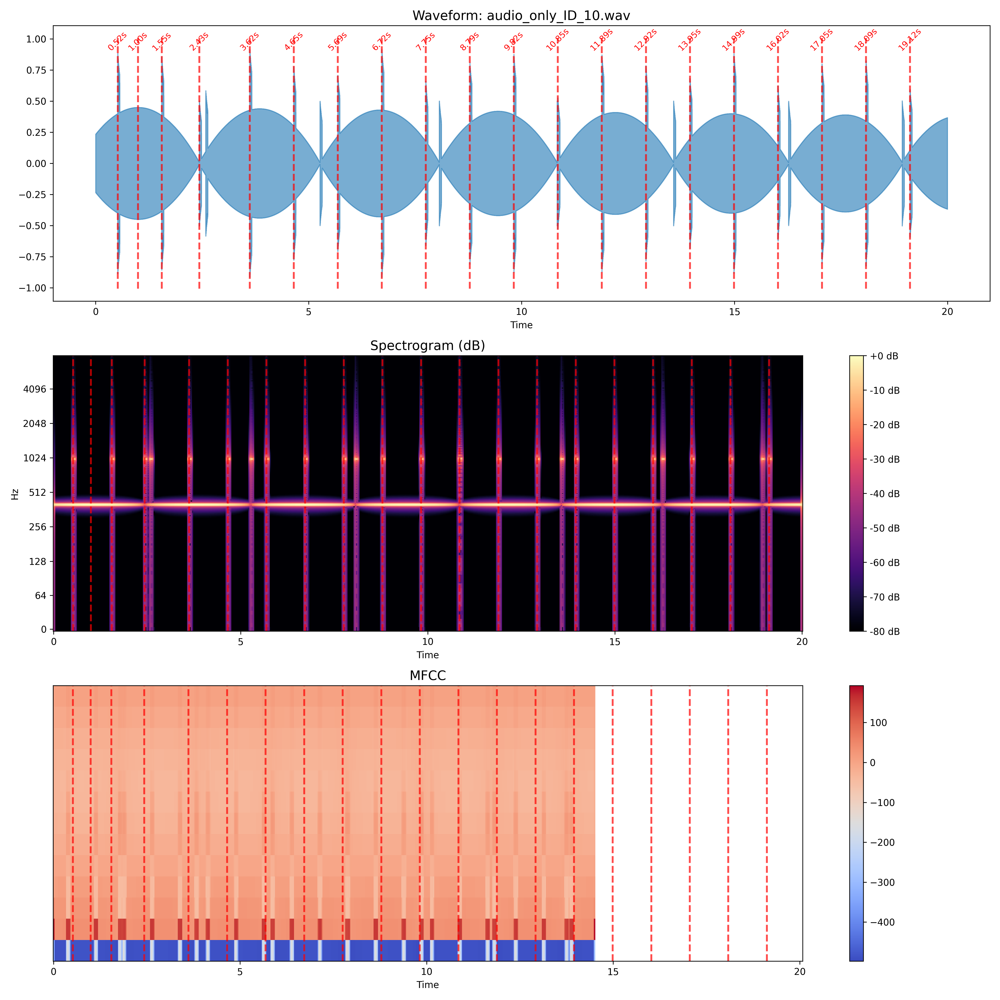

Analysis image 2: audio_only_ID_11_analysis.png


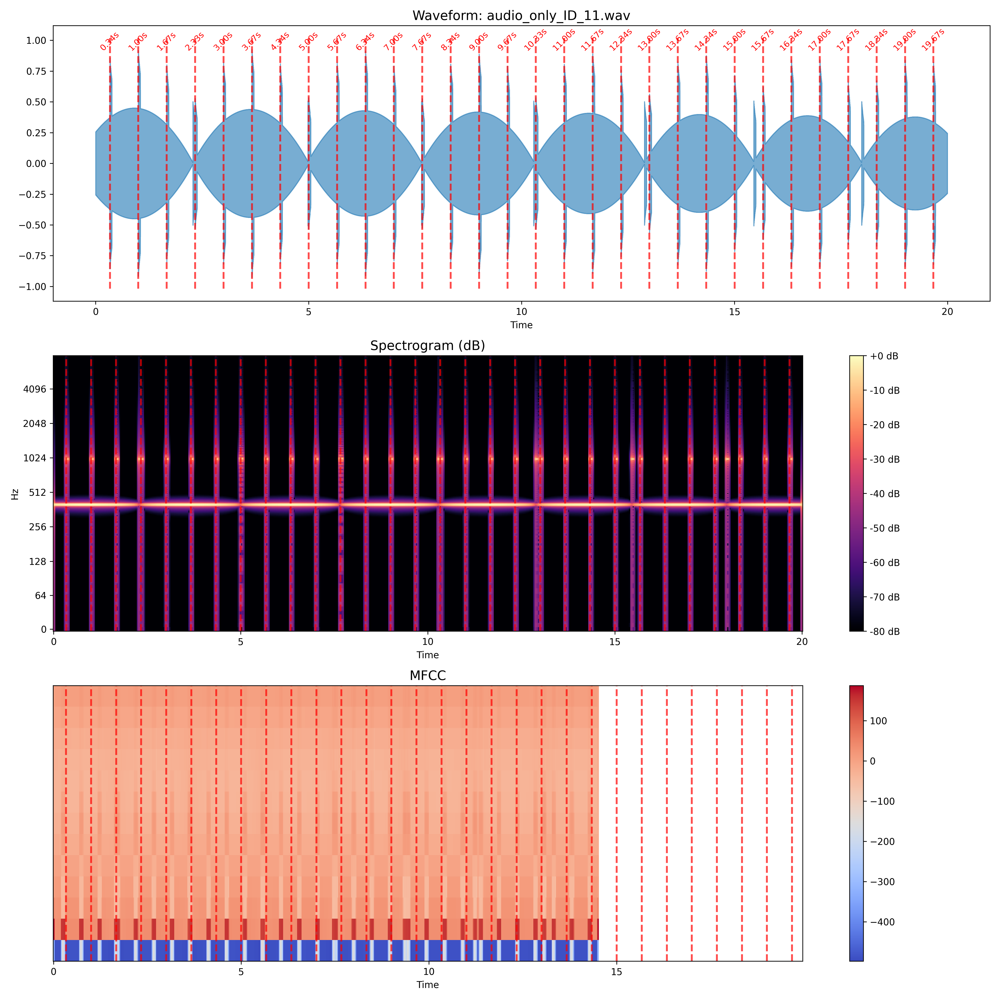

Analysis image 3: audio_only_ID_12_analysis.png


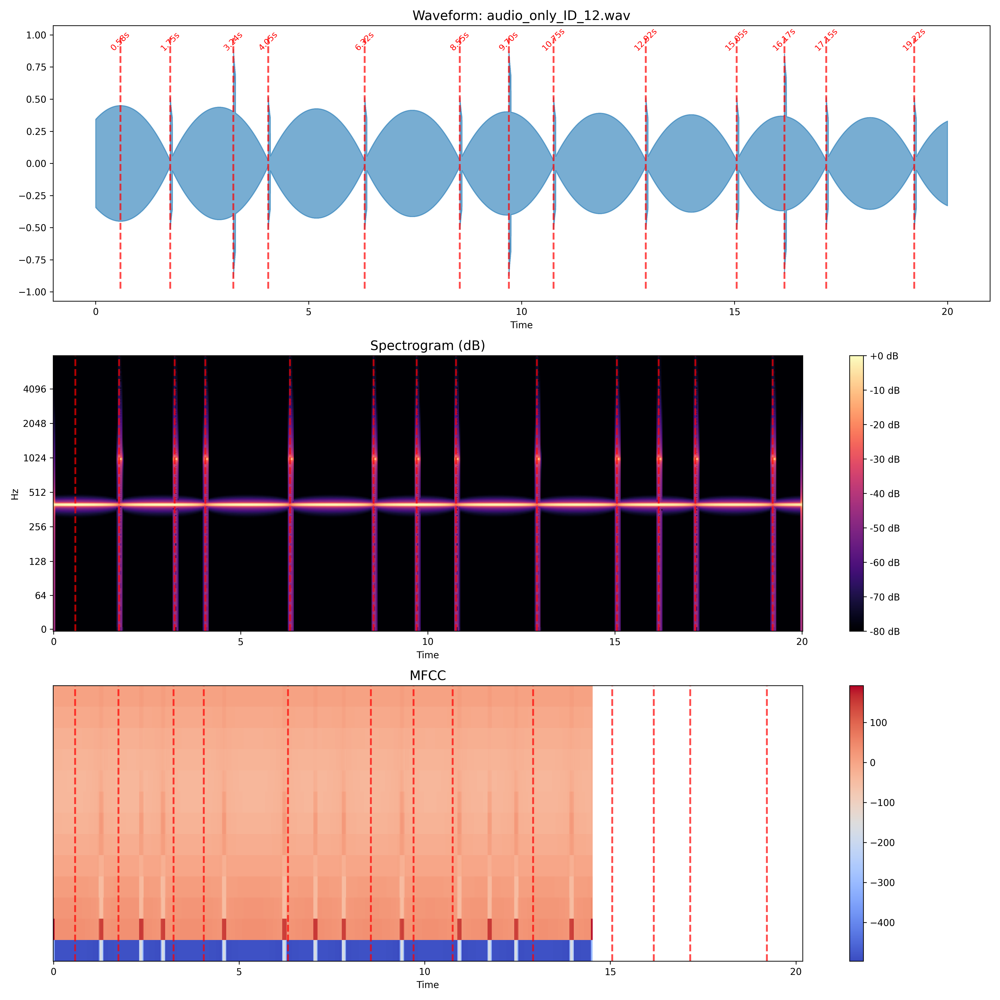


Found 45 beep detail images
Beep details image 1: audio_only_ID_10_beep_details.png


In [59]:
import os
import glob
from IPython.display import Image, display

# Base directory
audio_vis_path = './beep_visualizations'  # Adjust this to your visualization directory

# Find files with specific endings
analysis_files = glob.glob(os.path.join(audio_vis_path, '*analysis.png'))
beep_files = glob.glob(os.path.join(audio_vis_path, '*beep_details.png'))

# Display some analysis images
print(f"Found {len(analysis_files)} analysis images")
for i, im_path in enumerate(analysis_files[:3]):  # Show first 3
    print(f"Analysis image {i+1}: {os.path.basename(im_path)}")
    display(Image(filename=im_path, width=800))

# Display some beep detail images
print(f"\nFound {len(beep_files)} beep detail images")
for i, im_path in enumerate(beep_files[:1]):  # Show first 3
    print(f"Beep details image {i+1}: {os.path.basename(im_path)}")
    display(Image(filename=im_path, width=800))

In [36]:
def save_audio_collision_timestamps(audio_dir, output_dir):
    """
    Process all audio files in a directory and save collision timestamps to separate files.
    
    Parameters:
    audio_dir (str): Directory containing audio files (.wav)
    output_dir (str): Directory where timestamp files will be saved
    """
    
    # Create output directory if it doesn't exist
    os.makedirs(output_dir, exist_ok=True)
    
    # Get all audio files
    audio_files = sorted([f for f in os.listdir(audio_dir) if f.endswith('.wav')])
    
    print(f"Processing {len(audio_files)} audio files...")
    
    # Process each audio file
    for audio_file in tqdm(audio_files):
        audio_path = os.path.join(audio_dir, audio_file)
        
        # Detect collisions
        collisions = detect_audio_collisions(audio_path)
        print(f"Collisions in {audio_file}: ", collisions)
        
        # Create output filename (replace .wav with .json)
        output_filename = os.path.splitext(audio_file)[0] + '_collisions.json'
        output_path = os.path.join(output_dir, output_filename)
        
        # Save collisions to JSON file
        with open(output_path, 'w') as f:
            json.dump({
                'audio_file': audio_file,
                'collision_timestamps': collisions,
                'num_collisions': len(collisions)
            }, f, indent=4)
    
    print(f"Audio collision timestamps saved to {output_dir}")

## Match Collisions in audio and video files

In [44]:
def match_collision_patterns(video_collisions, audio_collisions, duration):
    """
    Match collision patterns between video and audio with improved robustness.
    Returns a similarity score (lower is better).
    
    Parameters:
    video_collisions (list): Timestamps of collisions detected in video
    audio_collisions (list): Timestamps of beeps detected in audio
    duration (float): Duration of the media in seconds
    
    Returns:
    float: Similarity score (lower is better)
    """
    import numpy as np
    from scipy import signal
    from scipy.ndimage import gaussian_filter1d

    
    # Handle cases with no collisions
    if len(video_collisions) == 0 and len(audio_collisions) == 0:
        return 0.0  # Perfect match if both have no collisions
    elif len(video_collisions) == 0 or len(audio_collisions) == 0:
        return float('inf')  # No match if only one has collisions
    
    # Use a higher resolution for better precision
    resolution = 200  # Increased from 100 for finer granularity
    
    # Create binary collision patterns with higher resolution
    video_pattern = np.zeros(resolution)
    audio_pattern = np.zeros(resolution)
    
    # Fill patterns with normalized duration
    # This handles cases where audio and video have different durations
    min_duration = min(duration, max(max(video_collisions, default=0), max(audio_collisions, default=0)) * 1.1)
    
    # Fill patterns with collision events
    for t in video_collisions:
        if t <= min_duration:  # Only consider collisions within duration
            bin_idx = int((t / min_duration) * resolution)
            if 0 <= bin_idx < resolution:
                video_pattern[bin_idx] = 1
    
    for t in audio_collisions:
        if t <= min_duration:  # Only consider collisions within duration
            bin_idx = int((t / min_duration) * resolution)
            if 0 <= bin_idx < resolution:
                audio_pattern[bin_idx] = 1
    
    # Apply Gaussian smoothing with variable sigma based on pattern density
    # This accounts for slight timing differences between audio and video
    sigma = max(1.0, min(3.0, resolution / (max(len(video_collisions), len(audio_collisions)) * 4)))
    video_pattern_smooth = gaussian_filter1d(video_pattern, sigma=sigma)
    audio_pattern_smooth = gaussian_filter1d(audio_pattern, sigma=sigma)
    
    # Calculate cross-correlation with normalization
    # This finds the best alignment between patterns
    xcorr = signal.correlate(video_pattern_smooth, audio_pattern_smooth, mode='full')
    max_xcorr_idx = np.argmax(xcorr)
    max_xcorr = xcorr[max_xcorr_idx]
    
    # Find the optimal alignment shift
    shift = max_xcorr_idx - (len(video_pattern_smooth) - 1)
    
    # Apply the shift for better comparison
    if shift > 0:
        aligned_video = np.zeros_like(video_pattern_smooth)
        aligned_video[shift:] = video_pattern_smooth[:-shift] if shift < len(video_pattern_smooth) else []
        aligned_video_pattern = aligned_video
    elif shift < 0:
        aligned_video = np.zeros_like(video_pattern_smooth)
        aligned_video[:shift] = video_pattern_smooth[-shift:] if -shift < len(video_pattern_smooth) else []
        aligned_video_pattern = aligned_video
    else:
        aligned_video_pattern = video_pattern_smooth
    
    # Calculate similarity metrics with the aligned patterns
    
    # 1. Pattern difference after alignment (L1 distance)
    # Normalize patterns for comparison
    video_sum = np.sum(aligned_video_pattern)
    audio_sum = np.sum(audio_pattern_smooth)
    
    if video_sum > 0 and audio_sum > 0:
        video_norm = aligned_video_pattern / video_sum
        audio_norm = audio_pattern_smooth / audio_sum
        pattern_diff = np.sum(np.abs(video_norm - audio_norm))
    else:
        pattern_diff = 2.0  # Maximum possible L1 distance for normalized patterns
    
    # 2. Timing structure similarity
    # Compare intervals between collisions
    if len(video_collisions) > 1 and len(audio_collisions) > 1:
        video_intervals = np.diff(sorted(video_collisions))
        audio_intervals = np.diff(sorted(audio_collisions))
        
        # Get interval histograms
        video_hist, _ = np.histogram(video_intervals, bins=10, range=(0, min_duration/5))
        audio_hist, _ = np.histogram(audio_intervals, bins=10, range=(0, min_duration/5))
        
        # Normalize histograms
        if np.sum(video_hist) > 0:
            video_hist = video_hist / np.sum(video_hist)
        if np.sum(audio_hist) > 0:
            audio_hist = audio_hist / np.sum(audio_hist)
            
        interval_diff = np.sum(np.abs(video_hist - audio_hist))
    else:
        interval_diff = 1.0
    
    # 3. Count similarity - penalize large differences in collision counts
    count_ratio = min(len(video_collisions), len(audio_collisions)) / max(len(video_collisions), len(audio_collisions))
    count_similarity = 1.0 - count_ratio
    
    # Combine metrics with weights (lower is better)
    # Normalize cross-correlation to 0-1 range (1 is perfect match)
    norm_xcorr = max_xcorr / (np.sqrt(np.sum(video_pattern_smooth**2) * np.sum(audio_pattern_smooth**2)) + 1e-10)
    
    # Combine metrics (lower is better)
    similarity = (
        pattern_diff * 0.4 +      # Pattern shape similarity (40%)
        interval_diff * 0.2 +     # Interval structure similarity (20%)
        count_similarity * 0.2 -  # Count similarity (20%)
        norm_xcorr * 0.2          # Cross-correlation (20%, subtracted because higher is better)
    )
    
    return similarity


In [ ]:
def visualize_pattern_match(video_collisions, audio_collisions, duration, video_file="", audio_file="", output_dir=None):
    """
    Visualize the pattern matching between video and audio collisions.
    
    Parameters:
    video_collisions (list): Timestamps of collisions detected in video
    audio_collisions (list): Timestamps of beeps detected in audio
    duration (float): Duration of the media in seconds
    video_file (str): Name of the video file for display
    audio_file (str): Name of the audio file for display
    output_dir (str): Directory to save visualization (if None, display instead)
    """
    
    # Use a higher resolution for visualization
    resolution = 200
    
    # Calculate minimum duration that covers all events
    min_duration = min(duration, max(max(video_collisions, default=0), max(audio_collisions, default=0)) * 1.1)
    
    # Create binary collision patterns
    video_pattern = np.zeros(resolution)
    audio_pattern = np.zeros(resolution)
    
    # Fill patterns
    for t in video_collisions:
        if t <= min_duration:
            bin_idx = int((t / min_duration) * resolution)
            if 0 <= bin_idx < resolution:
                video_pattern[bin_idx] = 1
    
    for t in audio_collisions:
        if t <= min_duration:
            bin_idx = int((t / min_duration) * resolution)
            if 0 <= bin_idx < resolution:
                audio_pattern[bin_idx] = 1
    
    # Apply Gaussian smoothing
    sigma = max(1.0, min(3.0, resolution / (max(len(video_collisions), len(audio_collisions)) * 4)))
    video_pattern_smooth = gaussian_filter1d(video_pattern, sigma=sigma)
    audio_pattern_smooth = gaussian_filter1d(audio_pattern, sigma=sigma)
    
    # Calculate cross-correlation
    xcorr = signal.correlate(video_pattern_smooth, audio_pattern_smooth, mode='full')
    max_xcorr_idx = np.argmax(xcorr)
    
    # Find optimal shift
    shift = max_xcorr_idx - (len(video_pattern_smooth) - 1)
    
    # Apply shift to video pattern
    if shift > 0:
        aligned_video = np.zeros_like(video_pattern_smooth)
        aligned_video[shift:] = video_pattern_smooth[:-shift] if shift < len(video_pattern_smooth) else []
    elif shift < 0:
        aligned_video = np.zeros_like(video_pattern_smooth)
        aligned_video[:shift] = video_pattern_smooth[-shift:] if -shift < len(video_pattern_smooth) else []
    else:
        aligned_video = video_pattern_smooth
    
    # Calculate similarity score
    similarity = match_collision_patterns(video_collisions, audio_collisions, duration)
    
    # Create visualization
    plt.figure(figsize=(12, 10))
    
    # Plot 1: Original patterns
    plt.subplot(3, 1, 1)
    x = np.linspace(0, min_duration, resolution)
    plt.plot(x, video_pattern_smooth, 'b-', label='Video', alpha=0.7)
    plt.plot(x, audio_pattern_smooth, 'r-', label='Audio', alpha=0.7)
    
    # Mark collision points
    for t in video_collisions:
        if t <= min_duration:
            plt.axvline(t, color='b', linestyle='--', alpha=0.3)
    
    for t in audio_collisions:
        if t <= min_duration:
            plt.axvline(t, color='r', linestyle='--', alpha=0.3)
    
    plt.title(f"Collision Patterns - Video: {video_file}, Audio: {audio_file}")
    plt.legend()
    plt.grid(True)
    
    # Plot 2: Aligned patterns
    plt.subplot(3, 1, 2)
    plt.plot(x, aligned_video, 'b-', label='Video (aligned)', alpha=0.7)
    plt.plot(x, audio_pattern_smooth, 'r-', label='Audio', alpha=0.7)
    plt.title(f"Aligned Patterns (Shift: {shift/resolution*min_duration:.2f}s)")
    plt.legend()
    plt.grid(True)
    
    # Plot 3: Cross-correlation
    plt.subplot(3, 1, 3)
    xcorr_x = np.linspace(-min_duration, min_duration, len(xcorr))
    plt.plot(xcorr_x, xcorr)
    plt.axvline(xcorr_x[max_xcorr_idx], color='r', linestyle='--')
    plt.title(f"Cross-correlation (Similarity Score: {similarity:.4f}, lower is better)")
    plt.grid(True)
    
    plt.tight_layout()
    
    # Save or display
    if output_dir:
        os.makedirs(output_dir, exist_ok=True)
        output_name = f"match_{os.path.splitext(os.path.basename(video_file))[0]}_{os.path.splitext(os.path.basename(audio_file))[0]}.png"
        output_path = os.path.join(output_dir, output_name)
        plt.savefig(output_path, dpi=300)
        plt.close()
        plt.show()
        print(f"Match visualization saved to {output_path}")
    else:
        plt.show()

In [54]:
def match_using_saved_collisions(video_collision_dir, audio_collision_dir, output_dir='./matches'):
    """
    Match audio and video files using saved collision data from JSON files.
    Outputs a simple CSV with audio_file,video_file format.
    
    Parameters:
    video_collision_dir (str): Directory containing video collision JSON files
    audio_collision_dir (str): Directory containing audio collision JSON files
    output_dir (str): Directory to save matching results and visualizations
    """
    import os
    import json
    import pandas as pd
    import numpy as np
    from scipy import signal
    from scipy.ndimage import gaussian_filter1d
    from tqdm import tqdm
    import matplotlib.pyplot as plt
    
    # Create output directory
    os.makedirs(output_dir, exist_ok=True)
    
    # Get all video collision files
    video_files = [f for f in os.listdir(video_collision_dir) if f.endswith('_collisions.json')]
    
    # Get all audio collision files
    audio_files = [f for f in os.listdir(audio_collision_dir) if f.endswith('_collisions.json')]
    
    print(f"Found {len(video_files)} video files and {len(audio_files)} audio files")
    
    # Load video collision data
    video_collisions = {}
    video_durations = {}
    
    for video_file in video_files:
        file_path = os.path.join(video_collision_dir, video_file)
        with open(file_path, 'r') as f:
            data = json.load(f)
            
        # Store collision timestamps and duration
        original_video = data.get('video_file', os.path.splitext(video_file)[0].replace('_collisions', ''))
        video_collisions[original_video] = data.get('collision_timestamps', [])
        video_durations[original_video] = data.get('duration', 0)
    
    # Load audio collision data
    audio_collisions = {}
    audio_durations = {}
    
    for audio_file in audio_files:
        file_path = os.path.join(audio_collision_dir, audio_file)
        with open(file_path, 'r') as f:
            data = json.load(f)
            
        # Store collision timestamps and duration
        original_audio = data.get('audio_file', os.path.splitext(audio_file)[0].replace('_collisions', ''))
        audio_collisions[original_audio] = data.get('collision_timestamps', [])
        audio_durations[original_audio] = data.get('duration', 0)
    
    # Match audio to video
    print("Matching audio to video based on collision patterns...")
    matches = []
    
    # Create a visualization directory
    viz_dir = os.path.join(output_dir, 'visualizations')
    os.makedirs(viz_dir, exist_ok=True)
    
    # For each audio file, find the best matching video
    for audio_file in tqdm(audio_collisions.keys(), desc="Matching files"):
        audio_collisions_list = audio_collisions[audio_file]
        audio_duration = audio_durations[audio_file]
        
        best_match = None
        best_score = float('inf')
        all_scores = []
        
        for video_file in video_collisions.keys():
            video_collisions_list = video_collisions[video_file]
            video_duration = video_durations[video_file]
            
            # Skip if either has no collisions
            if len(video_collisions_list) == 0 or len(audio_collisions_list) == 0:
                score = float('inf')
            else:
                # Use the minimum duration for matching
                min_duration = min(audio_duration, video_duration)
                if min_duration == 0:
                    min_duration = max(
                        max(video_collisions_list) if video_collisions_list else 0,
                        max(audio_collisions[audio_file]) if audio_collisions[audio_file] else 0
                    ) * 1.1
                
                # Match collision patterns
                score = match_collision_patterns(
                    video_collisions_list, 
                    audio_collisions_list, 
                    min_duration
                )
            
            all_scores.append((video_file, score))
            
            if score < best_score:
                best_score = score
                best_match = video_file
        
        # Sort all scores for this audio file
        all_scores.sort(key=lambda x: x[1])
        
        # Create visualization for top matches
        if len(all_scores) > 0 and best_match is not None:
            # Visualize the best match
            top_match = all_scores[0]
            min_duration = min(
                audio_durations[audio_file] or float('inf'),
                video_durations[top_match[0]] or float('inf')
            )
            if min_duration == float('inf'):
                min_duration = max(
                    max(video_collisions[top_match[0]]) if video_collisions[top_match[0]] else 0,
                    max(audio_collisions[audio_file]) if audio_collisions[audio_file] else 0
                ) * 1.1
            
            try:
                visualize_pattern_match(
                    video_collisions[top_match[0]],
                    audio_collisions[audio_file],
                    min_duration,
                    video_file=top_match[0],
                    audio_file=audio_file,
                    output_dir=viz_dir
                )
            except Exception as e:
                print(f"Warning: Could not visualize match for {audio_file} and {top_match[0]}: {e}")
        
        matches.append((audio_file, best_match, best_score))
    
    # Convert matches to DataFrame
    matches_df = pd.DataFrame(matches, columns=['audio_file', 'video_file', 'match_score'])
    
    # Save matches to CSV in the exact format shown, with just audio_file and video_file columns
    csv_path = os.path.join(output_dir, 'audio_video_matches.csv')
    
    # Clean up the filenames to match the format shown
    matches_df['audio_file'] = matches_df['audio_file'].apply(lambda x: os.path.basename(x))
    matches_df['video_file'] = matches_df['video_file'].apply(lambda x: os.path.basename(x) if x else "")
    
    # Save only the audio_file and video_file columns, with no index
    matches_df[['audio_file', 'video_file']].to_csv(csv_path, index=False)
    print(f"Matches saved to {csv_path}")
    
    # Also save full results with scores as JSON for programmatic access
    json_path = os.path.join(output_dir, 'audio_video_matches_with_scores.json')
    matches_df.to_json(json_path, orient='records')
    
    # Create and save a heatmap visualization of match scores
    if len(audio_collisions) > 0 and len(video_collisions) > 0:
        try:
            # Create a matrix of match scores
            audio_files = list(audio_collisions.keys())
            video_files = list(video_collisions.keys())
            
            score_matrix = np.full((len(audio_files), len(video_files)), np.nan)
            
            for i, audio_file in enumerate(audio_files):
                for j, video_file in enumerate(video_files):
                    # Find this pair in the matches
                    for audio, video, score in matches:
                        if audio == audio_file and video == video_file:
                            score_matrix[i, j] = score
                            break
            
            # Create heatmap
            plt.figure(figsize=(12, 10))
            plt.imshow(score_matrix, cmap='viridis_r')  # viridis_r: darker is better match
            plt.colorbar(label='Match Score (lower is better)')
            
            # Set tick labels
            plt.xticks(range(len(video_files)), [os.path.basename(v) for v in video_files], rotation=90)
            plt.yticks(range(len(audio_files)), [os.path.basename(a) for a in audio_files])
            
            plt.title('Audio-Video Match Scores (lower is better)')
            plt.tight_layout()
            
            # Save heatmap
            heatmap_path = os.path.join(output_dir, 'match_score_heatmap.png')
            plt.savefig(heatmap_path, dpi=300)
            plt.close()
            print(f"Match score heatmap saved to {heatmap_path}")
        except Exception as e:
            print(f"Warning: Could not create heatmap visualization: {e}")
    
    return matches_df

In [55]:
# Paths to audio and video directories
audio_dir = './dataset/audio_only'
video_dir = './dataset/video_only'
video_collision_dir = './video_collisions'
audio_collision_dir = './audio_collisions'
match_output_dir = './matches'

In [56]:
def main():
    # Match audio to video
    save_collision_timestamps(video_dir, video_collision_dir)
    save_audio_collision_timestamps(audio_dir, audio_collision_dir)
    # Match audio to video using saved collision data
    matches = match_using_saved_collisions(
        video_collision_dir,
        audio_collision_dir,
        match_output_dir
    )
    
    # Print top matches
    print("\nTop 5 matches:")
    pd.set_option('display.max_rows', 5)
    print(matches.sort_values('match_score').head())
    
    return matches

if __name__ == "__main__":
    main()

Processing 45 videos...


  2%|▏         | 1/45 [00:00<00:36,  1.20it/s]

Found 30 collisions in ./dataset/video_only\video_only_ID_1.mp4
Collisions in video_only_ID_1.mp4:  [0.3333333333333333, 1.0, 1.6666666666666667, 2.3333333333333335, 3.0, 3.6666666666666665, 4.333333333333333, 5.0, 5.666666666666667, 6.333333333333333, 7.0, 7.666666666666667, 8.333333333333334, 9.0, 9.666666666666666, 10.333333333333334, 11.0, 11.666666666666666, 12.333333333333334, 13.0, 13.666666666666666, 14.333333333333334, 15.0, 15.666666666666666, 16.333333333333332, 17.0, 17.666666666666668, 18.333333333333332, 19.0, 19.666666666666668]


  4%|▍         | 2/45 [00:01<00:36,  1.19it/s]

Found 17 collisions in ./dataset/video_only\video_only_ID_10.mp4
Collisions in video_only_ID_10.mp4:  [1.3333333333333333, 1.8, 3.4166666666666665, 5.466666666666667, 7.483333333333333, 7.916666666666667, 8.883333333333333, 9.466666666666667, 11.433333333333334, 12.533333333333333, 13.333333333333334, 15.216666666666667, 16.016666666666666, 17.066666666666666, 18.866666666666667, 19.183333333333334, 19.65]


  7%|▋         | 3/45 [00:02<00:32,  1.28it/s]

Found 24 collisions in ./dataset/video_only\video_only_ID_11.mp4
Collisions in video_only_ID_11.mp4:  [0.4166666666666667, 1.25, 2.0833333333333335, 2.9166666666666665, 3.75, 4.583333333333333, 5.416666666666667, 6.25, 7.083333333333333, 7.916666666666667, 8.75, 9.583333333333334, 10.416666666666666, 11.25, 12.083333333333334, 12.916666666666666, 13.75, 14.583333333333334, 15.416666666666666, 16.25, 17.083333333333332, 17.916666666666668, 18.75, 19.583333333333332]


  9%|▉         | 4/45 [00:03<00:32,  1.28it/s]

Found 17 collisions in ./dataset/video_only\video_only_ID_12.mp4
Collisions in video_only_ID_12.mp4:  [0.36666666666666664, 2.716666666666667, 3.45, 3.65, 4.133333333333334, 6.533333333333333, 7.166666666666667, 7.85, 10.1, 10.85, 11.55, 13.833333333333334, 14.5, 15.2, 17.35, 18.116666666666667, 18.85]


 11%|█         | 5/45 [00:04<00:32,  1.25it/s]

Found 22 collisions in ./dataset/video_only\video_only_ID_13.mp4
Collisions in video_only_ID_13.mp4:  [1.0666666666666667, 1.7166666666666666, 2.6, 3.066666666666667, 5.033333333333333, 5.8, 6.566666666666666, 6.966666666666667, 7.8, 8.866666666666667, 9.25, 10.733333333333333, 11.083333333333334, 12.55, 13.0, 13.5, 14.366666666666667, 16.133333333333333, 17.016666666666666, 17.866666666666667, 18.2, 19.566666666666666]


 13%|█▎        | 6/45 [00:04<00:31,  1.23it/s]

Found 24 collisions in ./dataset/video_only\video_only_ID_14.mp4
Collisions in video_only_ID_14.mp4:  [0.43333333333333335, 1.3, 2.1666666666666665, 3.033333333333333, 3.9, 4.766666666666667, 5.633333333333334, 6.5, 7.366666666666666, 8.233333333333333, 9.1, 9.5, 9.966666666666667, 10.833333333333334, 11.7, 12.566666666666666, 13.433333333333334, 14.3, 15.166666666666666, 16.033333333333335, 16.9, 17.766666666666666, 18.633333333333333, 19.5]


 16%|█▌        | 7/45 [00:05<00:30,  1.26it/s]

Found 24 collisions in ./dataset/video_only\video_only_ID_15.mp4
Collisions in video_only_ID_15.mp4:  [0.5833333333333334, 1.75, 2.9166666666666665, 3.8666666666666667, 4.083333333333333, 5.25, 6.083333333333333, 6.416666666666667, 7.583333333333333, 8.233333333333333, 8.75, 9.916666666666666, 10.366666666666667, 11.083333333333334, 12.25, 12.466666666666667, 13.416666666666666, 14.583333333333334, 15.75, 16.566666666666666, 16.916666666666668, 18.083333333333332, 18.566666666666666, 19.25]


 18%|█▊        | 8/45 [00:06<00:29,  1.26it/s]

Found 20 collisions in ./dataset/video_only\video_only_ID_16.mp4
Collisions in video_only_ID_16.mp4:  [0.7333333333333333, 1.5, 2.2, 3.6666666666666665, 5.133333333333334, 5.8, 6.6, 8.066666666666666, 9.533333333333333, 9.966666666666667, 11.0, 12.0, 12.466666666666667, 14.0, 15.4, 15.95, 16.866666666666667, 17.916666666666668, 18.333333333333332, 19.783333333333335]


 20%|██        | 9/45 [00:07<00:28,  1.26it/s]

Found 17 collisions in ./dataset/video_only\video_only_ID_17.mp4
Collisions in video_only_ID_17.mp4:  [0.8833333333333333, 1.6666666666666667, 3.9166666666666665, 4.983333333333333, 6.133333333333334, 8.316666666666666, 10.466666666666667, 10.966666666666667, 11.683333333333334, 12.583333333333334, 14.183333333333334, 14.666666666666666, 15.033333333333333, 15.683333333333334, 16.716666666666665, 18.45, 18.733333333333334]


 22%|██▏       | 10/45 [00:07<00:27,  1.26it/s]

Found 20 collisions in ./dataset/video_only\video_only_ID_18.mp4
Collisions in video_only_ID_18.mp4:  [1.0666666666666667, 2.066666666666667, 2.4, 3.4833333333333334, 4.6, 5.283333333333333, 5.85, 7.1, 9.166666666666666, 9.566666666666666, 11.116666666666667, 12.0, 12.916666666666666, 14.4, 14.733333333333333, 16.15, 16.766666666666666, 17.583333333333332, 18.216666666666665, 19.1]


 24%|██▍       | 11/45 [00:08<00:27,  1.24it/s]

Found 20 collisions in ./dataset/video_only\video_only_ID_19.mp4
Collisions in video_only_ID_19.mp4:  [0.6, 1.8, 2.183333333333333, 3.0, 4.2, 4.816666666666666, 5.4, 6.6, 7.416666666666667, 7.8, 9.0, 9.983333333333333, 10.2, 11.4, 12.516666666666667, 13.8, 15.0, 16.2, 17.466666666666665, 18.6]


 27%|██▋       | 12/45 [00:09<00:28,  1.16it/s]

Found 20 collisions in ./dataset/video_only\video_only_ID_2.mp4
Collisions in video_only_ID_2.mp4:  [0.5666666666666667, 1.8, 2.7333333333333334, 3.7, 4.9, 5.816666666666666, 6.816666666666666, 7.8, 8.066666666666666, 8.866666666666667, 9.9, 10.783333333333333, 11.316666666666666, 11.883333333333333, 13.716666666666667, 14.566666666666666, 14.866666666666667, 16.616666666666667, 17.816666666666666, 19.45]


 29%|██▉       | 13/45 [00:10<00:29,  1.07it/s]

Found 14 collisions in ./dataset/video_only\video_only_ID_20.mp4
Collisions in video_only_ID_20.mp4:  [1.2666666666666666, 1.9333333333333333, 3.783333333333333, 4.366666666666666, 6.3, 6.766666666666667, 8.816666666666666, 9.133333333333333, 11.466666666666667, 13.766666666666667, 16.033333333333335, 16.366666666666667, 18.266666666666666, 18.883333333333333]


 31%|███       | 14/45 [00:11<00:30,  1.02it/s]

Found 19 collisions in ./dataset/video_only\video_only_ID_21.mp4
Collisions in video_only_ID_21.mp4:  [1.2, 3.2333333333333334, 3.75, 5.233333333333333, 5.8, 6.783333333333333, 7.2, 7.883333333333334, 9.133333333333333, 11.033333333333333, 11.966666666666667, 12.516666666666667, 12.9, 13.866666666666667, 14.1, 14.75, 16.533333333333335, 17.983333333333334, 18.283333333333335]


 33%|███▎      | 15/45 [00:13<00:30,  1.01s/it]

Found 25 collisions in ./dataset/video_only\video_only_ID_22.mp4
Collisions in video_only_ID_22.mp4:  [0.5333333333333333, 1.3, 1.6, 2.6666666666666665, 3.3666666666666667, 3.7333333333333334, 4.8, 5.4, 5.866666666666666, 6.933333333333334, 7.4, 8.0, 9.066666666666666, 9.366666666666667, 10.133333333333333, 11.2, 12.266666666666667, 13.333333333333334, 14.4, 15.466666666666667, 16.533333333333335, 16.9, 17.6, 18.666666666666668, 19.733333333333334]


 36%|███▌      | 16/45 [00:14<00:30,  1.04s/it]

Found 18 collisions in ./dataset/video_only\video_only_ID_23.mp4
Collisions in video_only_ID_23.mp4:  [0.36666666666666664, 2.8333333333333335, 3.466666666666667, 3.966666666666667, 6.483333333333333, 7.2, 7.883333333333334, 10.183333333333334, 10.9, 11.583333333333334, 13.866666666666667, 14.166666666666666, 14.566666666666666, 15.266666666666667, 17.566666666666666, 18.2, 18.7, 18.916666666666668]


 38%|███▊      | 17/45 [00:15<00:29,  1.04s/it]

Found 30 collisions in ./dataset/video_only\video_only_ID_24.mp4
Collisions in video_only_ID_24.mp4:  [0.3333333333333333, 1.0, 1.6666666666666667, 2.3333333333333335, 3.0, 3.6666666666666665, 4.333333333333333, 5.0, 5.666666666666667, 6.333333333333333, 7.0, 7.666666666666667, 8.333333333333334, 9.0, 9.666666666666666, 10.333333333333334, 11.0, 11.666666666666666, 12.333333333333334, 13.0, 13.666666666666666, 14.333333333333334, 15.0, 15.666666666666666, 16.333333333333332, 17.0, 17.666666666666668, 18.333333333333332, 19.0, 19.666666666666668]


 40%|████      | 18/45 [00:16<00:28,  1.07s/it]

Found 20 collisions in ./dataset/video_only\video_only_ID_25.mp4
Collisions in video_only_ID_25.mp4:  [0.38333333333333336, 1.4833333333333334, 2.0, 2.566666666666667, 3.6333333333333333, 4.716666666666667, 5.75, 7.366666666666666, 7.833333333333333, 9.883333333333333, 10.6, 11.866666666666667, 13.416666666666666, 13.833333333333334, 14.516666666666667, 14.766666666666667, 15.766666666666667, 16.55, 17.666666666666668, 19.533333333333335]


 42%|████▏     | 19/45 [00:17<00:28,  1.09s/it]

Found 20 collisions in ./dataset/video_only\video_only_ID_26.mp4
Collisions in video_only_ID_26.mp4:  [0.5166666666666667, 1.8833333333333333, 2.15, 2.8333333333333335, 3.5833333333333335, 5.116666666666666, 6.0, 6.45, 8.216666666666667, 9.133333333333333, 11.3, 12.233333333333333, 13.233333333333333, 14.233333333333333, 15.05, 15.3, 17.25, 17.916666666666668, 18.333333333333332, 19.35]


 44%|████▍     | 20/45 [00:18<00:26,  1.07s/it]

Found 17 collisions in ./dataset/video_only\video_only_ID_27.mp4
Collisions in video_only_ID_27.mp4:  [0.31666666666666665, 3.25, 3.816666666666667, 4.4, 7.233333333333333, 7.583333333333333, 7.883333333333334, 8.483333333333333, 11.25, 11.9, 12.5, 15.3, 15.883333333333333, 16.25, 16.5, 19.25, 19.833333333333332]


 47%|████▋     | 21/45 [00:19<00:25,  1.06s/it]

Found 30 collisions in ./dataset/video_only\video_only_ID_28.mp4
Collisions in video_only_ID_28.mp4:  [0.5833333333333334, 0.9333333333333333, 1.15, 1.75, 2.3333333333333335, 2.9, 3.25, 3.466666666666667, 4.05, 4.616666666666666, 5.183333333333334, 6.316666666666666, 7.433333333333334, 8.0, 8.55, 9.083333333333334, 9.65, 10.2, 10.483333333333333, 10.75, 11.266666666666667, 11.833333333333334, 12.383333333333333, 12.916666666666666, 14.55, 15.05, 16.15, 16.7, 17.15, 19.233333333333334]


 49%|████▉     | 22/45 [00:20<00:24,  1.07s/it]

Found 20 collisions in ./dataset/video_only\video_only_ID_29.mp4
Collisions in video_only_ID_29.mp4:  [0.9166666666666666, 1.4166666666666667, 1.9166666666666667, 2.5166666666666666, 3.55, 5.616666666666666, 7.2, 7.666666666666667, 8.683333333333334, 9.683333333333334, 11.666666666666666, 12.583333333333334, 13.2, 13.616666666666667, 15.533333333333333, 16.466666666666665, 17.416666666666668, 17.783333333333335, 19.25, 19.616666666666667]


 51%|█████     | 23/45 [00:21<00:24,  1.09s/it]

Found 15 collisions in ./dataset/video_only\video_only_ID_3.mp4
Collisions in video_only_ID_3.mp4:  [1.2333333333333334, 1.45, 3.2666666666666666, 4.35, 5.283333333333333, 7.233333333333333, 9.166666666666666, 10.15, 11.066666666666666, 12.933333333333334, 14.766666666666667, 15.95, 16.566666666666666, 18.333333333333332, 18.85]


 53%|█████▎    | 24/45 [00:22<00:22,  1.08s/it]

Found 21 collisions in ./dataset/video_only\video_only_ID_30.mp4
Collisions in video_only_ID_30.mp4:  [0.65, 1.2333333333333334, 1.95, 3.25, 4.55, 5.266666666666667, 5.85, 7.15, 8.45, 9.166666666666666, 9.75, 11.05, 12.35, 12.933333333333334, 13.65, 14.95, 16.25, 16.566666666666666, 17.55, 18.333333333333332, 18.85]


 56%|█████▌    | 25/45 [00:23<00:21,  1.09s/it]

Found 26 collisions in ./dataset/video_only\video_only_ID_31.mp4
Collisions in video_only_ID_31.mp4:  [0.38333333333333336, 1.15, 1.9166666666666667, 2.683333333333333, 3.45, 4.216666666666667, 4.983333333333333, 5.75, 6.516666666666667, 7.283333333333333, 8.05, 8.816666666666666, 9.583333333333334, 10.35, 11.116666666666667, 11.883333333333333, 12.65, 13.416666666666666, 14.183333333333334, 14.95, 15.716666666666667, 16.483333333333334, 17.25, 18.016666666666666, 18.783333333333335, 19.55]


 58%|█████▊    | 26/45 [00:25<00:20,  1.09s/it]

Found 21 collisions in ./dataset/video_only\video_only_ID_32.mp4
Collisions in video_only_ID_32.mp4:  [0.4166666666666667, 2.4166666666666665, 3.15, 3.933333333333333, 5.866666666666666, 6.6, 6.966666666666667, 7.366666666666666, 9.183333333333334, 9.5, 10.016666666666667, 10.75, 12.633333333333333, 13.4, 14.2, 15.966666666666667, 16.75, 17.1, 17.583333333333332, 19.183333333333334, 19.633333333333333]


 60%|██████    | 27/45 [00:26<00:19,  1.08s/it]

Found 27 collisions in ./dataset/video_only\video_only_ID_33.mp4
Collisions in video_only_ID_33.mp4:  [0.36666666666666664, 1.1, 1.8333333333333333, 2.566666666666667, 3.3, 4.033333333333333, 4.766666666666667, 5.5, 6.233333333333333, 6.966666666666667, 7.7, 8.433333333333334, 9.166666666666666, 9.9, 10.633333333333333, 11.366666666666667, 12.1, 12.833333333333334, 13.566666666666666, 14.3, 15.033333333333333, 15.766666666666667, 16.5, 17.233333333333334, 17.966666666666665, 18.7, 19.416666666666668]


 62%|██████▏   | 28/45 [00:27<00:18,  1.07s/it]

Found 21 collisions in ./dataset/video_only\video_only_ID_34.mp4
Collisions in video_only_ID_34.mp4:  [0.7166666666666667, 1.95, 2.15, 3.5833333333333335, 4.4, 5.016666666666667, 6.45, 6.816666666666666, 7.883333333333334, 9.316666666666666, 10.75, 11.55, 12.183333333333334, 13.616666666666667, 13.866666666666667, 15.05, 16.15, 16.483333333333334, 17.916666666666668, 18.4, 19.35]


 64%|██████▍   | 29/45 [00:28<00:17,  1.09s/it]

Found 20 collisions in ./dataset/video_only\video_only_ID_35.mp4
Collisions in video_only_ID_35.mp4:  [0.43333333333333335, 1.9333333333333333, 2.3833333333333333, 3.2, 5.166666666666667, 5.8, 7.916666666666667, 8.7, 9.633333333333333, 10.633333333333333, 13.1, 13.316666666666666, 13.533333333333333, 15.2, 15.766666666666667, 15.966666666666667, 16.416666666666668, 17.35, 17.85, 18.583333333333332]


 67%|██████▋   | 30/45 [00:29<00:16,  1.11s/it]

Found 20 collisions in ./dataset/video_only\video_only_ID_36.mp4
Collisions in video_only_ID_36.mp4:  [0.9666666666666667, 1.3666666666666667, 2.9, 3.466666666666667, 4.833333333333333, 5.533333333333333, 6.766666666666667, 7.566666666666666, 8.7, 9.566666666666666, 10.633333333333333, 11.533333333333333, 12.566666666666666, 13.45, 14.5, 15.333333333333334, 16.433333333333334, 17.183333333333334, 18.366666666666667, 19.016666666666666]


 69%|██████▉   | 31/45 [00:30<00:15,  1.10s/it]

Found 21 collisions in ./dataset/video_only\video_only_ID_37.mp4
Collisions in video_only_ID_37.mp4:  [0.13333333333333333, 0.7, 1.1666666666666667, 3.183333333333333, 5.166666666666667, 6.65, 7.116666666666666, 8.066666666666666, 8.633333333333333, 9.033333333333333, 9.7, 10.55, 10.916666666666666, 12.783333333333333, 13.116666666666667, 13.666666666666666, 14.583333333333334, 16.383333333333333, 18.116666666666667, 18.4, 19.833333333333332]


 71%|███████   | 32/45 [00:31<00:13,  1.02s/it]

Found 19 collisions in ./dataset/video_only\video_only_ID_38.mp4
Collisions in video_only_ID_38.mp4:  [0.4, 2.8, 3.6, 5.366666666666666, 6.0, 6.8, 8.55, 9.2, 9.4, 10.0, 11.716666666666667, 12.4, 13.2, 14.85, 15.6, 16.4, 17.866666666666667, 18.816666666666666, 19.6]


 73%|███████▎  | 33/45 [00:32<00:11,  1.06it/s]

Found 18 collisions in ./dataset/video_only\video_only_ID_39.mp4
Collisions in video_only_ID_39.mp4:  [1.2333333333333334, 2.2333333333333334, 3.25, 5.25, 7.216666666666667, 7.983333333333333, 8.766666666666667, 9.15, 11.05, 11.433333333333334, 12.916666666666666, 13.266666666666667, 14.283333333333333, 14.733333333333333, 15.933333333333334, 16.55, 18.3, 19.183333333333334]


 76%|███████▌  | 34/45 [00:32<00:10,  1.09it/s]

Found 15 collisions in ./dataset/video_only\video_only_ID_4.mp4
Collisions in video_only_ID_4.mp4:  [1.1833333333333333, 1.5333333333333334, 3.716666666666667, 5.883333333333334, 7.983333333333333, 8.283333333333333, 10.05, 10.65, 12.116666666666667, 13.016666666666667, 14.133333333333333, 15.383333333333333, 16.116666666666667, 17.75, 18.083333333333332]


 78%|███████▊  | 35/45 [00:33<00:08,  1.17it/s]

Found 17 collisions in ./dataset/video_only\video_only_ID_40.mp4
Collisions in video_only_ID_40.mp4:  [0.8666666666666667, 1.1833333333333333, 2.6, 3.216666666666667, 4.333333333333333, 5.216666666666667, 6.066666666666666, 7.183333333333334, 7.8, 9.116666666666667, 9.533333333333333, 11.0, 11.266666666666667, 13.0, 14.733333333333333, 16.5, 18.2]


 80%|████████  | 36/45 [00:34<00:07,  1.23it/s]

Found 17 collisions in ./dataset/video_only\video_only_ID_41.mp4
Collisions in video_only_ID_41.mp4:  [1.1166666666666667, 3.1333333333333333, 3.9, 5.116666666666666, 6.5, 7.083333333333333, 8.983333333333333, 10.866666666666667, 11.7, 12.716666666666667, 14.3, 14.516666666666667, 16.283333333333335, 16.9, 18.016666666666666, 19.5, 19.716666666666665]


 82%|████████▏ | 37/45 [00:35<00:06,  1.31it/s]

Found 23 collisions in ./dataset/video_only\video_only_ID_42.mp4
Collisions in video_only_ID_42.mp4:  [0.5166666666666667, 1.55, 2.5833333333333335, 3.6166666666666667, 4.65, 5.266666666666667, 5.683333333333334, 6.716666666666667, 7.75, 8.066666666666666, 8.783333333333333, 9.816666666666666, 10.85, 11.883333333333333, 12.916666666666666, 13.566666666666666, 13.95, 14.983333333333333, 16.016666666666666, 16.266666666666666, 17.05, 18.083333333333332, 19.116666666666667]


 84%|████████▍ | 38/45 [00:35<00:05,  1.33it/s]

Found 15 collisions in ./dataset/video_only\video_only_ID_43.mp4
Collisions in video_only_ID_43.mp4:  [1.0166666666666666, 2.216666666666667, 3.0166666666666666, 4.866666666666666, 7.05, 7.483333333333333, 9.05, 10.066666666666666, 11.083333333333334, 12.616666666666667, 13.116666666666667, 15.133333333333333, 17.133333333333333, 17.616666666666667, 19.15]


 87%|████████▋ | 39/45 [00:36<00:04,  1.37it/s]

Found 33 collisions in ./dataset/video_only\video_only_ID_44.mp4
Collisions in video_only_ID_44.mp4:  [0.3, 0.9, 1.5, 2.1, 2.7, 3.3, 3.9, 4.5, 5.1, 5.7, 6.3, 6.9, 7.5, 8.1, 8.7, 9.3, 9.9, 10.5, 11.1, 11.7, 12.316666666666666, 12.9, 13.5, 14.1, 14.7, 15.3, 15.9, 16.5, 17.1, 17.7, 18.3, 18.9, 19.5]


 89%|████████▉ | 40/45 [00:37<00:03,  1.40it/s]

Found 26 collisions in ./dataset/video_only\video_only_ID_45.mp4
Collisions in video_only_ID_45.mp4:  [0.45, 1.7166666666666666, 2.25, 2.683333333333333, 3.15, 4.65, 4.95, 5.85, 6.733333333333333, 7.7, 8.55, 9.45, 10.616666666666667, 11.25, 11.683333333333334, 12.15, 13.4, 13.95, 14.616666666666667, 14.85, 15.75, 16.216666666666665, 16.65, 17.533333333333335, 18.45, 19.35]


 91%|█████████ | 41/45 [00:37<00:02,  1.41it/s]

Found 24 collisions in ./dataset/video_only\video_only_ID_5.mp4
Collisions in video_only_ID_5.mp4:  [0.48333333333333334, 1.45, 1.7833333333333334, 2.4166666666666665, 3.3833333333333333, 4.35, 5.316666666666666, 6.283333333333333, 7.25, 8.216666666666667, 8.683333333333334, 9.183333333333334, 10.15, 10.916666666666666, 11.116666666666667, 12.083333333333334, 13.033333333333333, 14.016666666666667, 14.983333333333333, 15.95, 16.916666666666668, 17.883333333333333, 18.85, 19.816666666666666]


 93%|█████████▎| 42/45 [00:38<00:02,  1.39it/s]

Found 19 collisions in ./dataset/video_only\video_only_ID_6.mp4
Collisions in video_only_ID_6.mp4:  [0.4166666666666667, 2.316666666666667, 3.0833333333333335, 3.8666666666666667, 5.633333333333334, 6.466666666666667, 6.916666666666667, 7.25, 8.95, 9.816666666666666, 10.633333333333333, 12.266666666666667, 13.133333333333333, 13.966666666666667, 15.6, 16.416666666666668, 17.266666666666666, 18.766666666666666, 19.666666666666668]


 96%|█████████▌| 43/45 [00:39<00:01,  1.35it/s]

Found 18 collisions in ./dataset/video_only\video_only_ID_7.mp4
Collisions in video_only_ID_7.mp4:  [0.9, 1.7333333333333334, 2.7, 4.033333333333333, 4.5, 6.3, 8.1, 8.533333333333333, 9.9, 10.733333333333333, 11.7, 12.9, 13.5, 15.033333333333333, 15.3, 17.166666666666668, 18.9, 19.2]


 98%|█████████▊| 44/45 [00:40<00:00,  1.32it/s]

Found 18 collisions in ./dataset/video_only\video_only_ID_8.mp4
Collisions in video_only_ID_8.mp4:  [0.7666666666666667, 1.2833333333333334, 2.533333333333333, 3.783333333333333, 4.116666666666666, 5.416666666666667, 5.95, 7.65, 8.283333333333333, 9.35, 11.116666666666667, 12.75, 13.916666666666666, 14.45, 16.15, 16.683333333333334, 17.85, 19.416666666666668]


100%|██████████| 45/45 [00:40<00:00,  1.10it/s]


Found 16 collisions in ./dataset/video_only\video_only_ID_9.mp4
Collisions in video_only_ID_9.mp4:  [0.65, 1.1166666666666667, 3.1333333333333333, 5.116666666666666, 7.066666666666666, 8.583333333333334, 8.983333333333333, 10.483333333333333, 10.883333333333333, 12.716666666666667, 14.516666666666667, 15.083333333333334, 16.3, 18.066666666666666, 18.366666666666667, 19.766666666666666]
Collision timestamps saved to ./video_collisions
Processing 45 audio files...


  7%|▋         | 3/45 [00:00<00:01, 29.03it/s]

Found 12 beeps in ./dataset/audio_only\audio_only_ID_1.wav
Beep timestamps: ['1.16s', '1.62s', '2.73s', '4.26s', '4.85s', '5.82s', '8.09s', '8.87s', '11.32s', '11.88s', '14.55s', '17.78s']
Collisions in audio_only_ID_1.wav:  [1.164375, 1.619375, 2.7335625, 4.264375, 4.85175, 5.817875, 8.0855625, 8.867875, 11.319375, 11.8835625, 14.5531875, 17.7840625]
Found 20 beeps in ./dataset/audio_only\audio_only_ID_10.wav
Beep timestamps: ['0.52s', '1.00s', '1.55s', '2.43s', '3.62s', '4.65s', '5.69s', '6.72s', '7.75s', '8.79s', '9.82s', '10.85s', '11.89s', '12.92s', '13.95s', '14.99s', '16.02s', '17.05s', '18.09s', '19.12s']
Collisions in audio_only_ID_10.wav:  [0.519375, 0.996875, 1.55175, 2.4340625, 3.619375, 4.65175, 5.6855625, 6.719375, 7.75175, 8.7855625, 9.819375, 10.850375, 11.8855625, 12.919375, 13.95175, 14.9855625, 16.019375, 17.05175, 18.0855625, 19.119375]
Found 30 beeps in ./dataset/audio_only\audio_only_ID_11.wav
Beep timestamps: ['0.34s', '1.00s', '1.67s', '2.33s', '3.00s', '3.67s',

 16%|█▌        | 7/45 [00:00<00:01, 32.40it/s]

Found 25 beeps in ./dataset/audio_only\audio_only_ID_15.wav
Beep timestamps: ['0.40s', '1.20s', '2.00s', '2.80s', '3.60s', '4.40s', '5.20s', '6.00s', '6.80s', '7.60s', '8.40s', '9.20s', '10.00s', '10.80s', '11.60s', '12.40s', '13.20s', '14.00s', '14.80s', '15.60s', '16.40s', '17.20s', '18.00s', '18.80s', '19.60s']
Collisions in audio_only_ID_15.wav:  [0.40175, 1.20175, 2.00175, 2.80175, 3.60175, 4.40175, 5.20175, 6.00175, 6.80175, 7.60175, 8.40175, 9.20175, 10.00175, 10.80175, 11.60175, 12.40175, 13.20175, 14.00175, 14.8031875, 15.60175, 16.40175, 17.20175, 18.00175, 18.80175, 19.60175]
Found 10 beeps in ./dataset/audio_only\audio_only_ID_16.wav
Beep timestamps: ['0.78s', '2.42s', '3.33s', '4.60s', '7.25s', '9.57s', '12.00s', '14.40s', '16.92s', '19.10s']
Collisions in audio_only_ID_16.wav:  [0.776875, 2.419375, 3.331875, 4.60025, 7.25175, 9.567875, 12.00025, 14.40025, 16.919375, 19.10025]


 24%|██▍       | 11/45 [00:00<00:01, 33.60it/s]

Found 16 beeps in ./dataset/audio_only\audio_only_ID_17.wav
Beep timestamps: ['0.72s', '2.15s', '3.59s', '4.40s', '5.02s', '6.45s', '7.89s', '9.32s', '10.75s', '11.55s', '12.19s', '13.62s', '15.05s', '16.49s', '17.92s', '19.35s']
Collisions in audio_only_ID_17.wav:  [0.719375, 2.15175, 3.5855625, 4.40025, 5.019375, 6.45175, 7.8855625, 9.319375, 10.75175, 11.55175, 12.1855625, 13.619375, 15.0531875, 16.4855625, 17.919375, 19.35175]
Found 14 beeps in ./dataset/audio_only\audio_only_ID_18.wav
Beep timestamps: ['0.42s', '1.19s', '2.62s', '3.55s', '5.92s', '8.29s', '10.07s', '10.65s', '12.12s', '13.02s', '14.13s', '15.39s', '16.12s', '17.75s']
Collisions in audio_only_ID_18.wav:  [0.416875, 1.1855625, 2.616875, 3.55175, 5.917375, 8.2855625, 10.067875, 10.65175, 12.117875, 13.019375, 14.1340625, 15.3855625, 16.117875, 17.75175]
Found 21 beeps in ./dataset/audio_only\audio_only_ID_19.wav
Beep timestamps: ['0.49s', '1.45s', '2.42s', '3.39s', '4.35s', '5.32s', '6.42s', '7.25s', '8.22s', '9.19s'

 42%|████▏     | 19/45 [00:00<00:00, 33.02it/s]

Found 16 beeps in ./dataset/audio_only\audio_only_ID_23.wav
Beep timestamps: ['0.28s', '1.79s', '2.37s', '3.42s', '5.47s', '7.48s', '8.92s', '9.47s', '11.42s', '12.49s', '13.33s', '15.23s', '16.05s', '17.07s', '18.87s', '19.62s']
Collisions in audio_only_ID_23.wav:  [0.279375, 1.7855625, 2.366875, 3.417875, 5.467875, 7.4840625, 8.919375, 9.467875, 11.417875, 12.4855625, 13.3340625, 15.2341875, 16.05175, 17.067875, 18.867875, 19.619375]
Found 11 beeps in ./dataset/audio_only\audio_only_ID_24.wav
Beep timestamps: ['1.22s', '3.65s', '5.31s', '6.09s', '7.17s', '8.52s', '10.85s', '13.39s', '14.50s', '15.82s', '18.12s']
Collisions in audio_only_ID_24.wav:  [1.219375, 3.65175, 5.314375, 6.0855625, 7.167875, 8.519375, 10.85025, 13.3855625, 14.50025, 15.819375, 18.116875]
Found 13 beeps in ./dataset/audio_only\audio_only_ID_25.wav
Beep timestamps: ['0.05s', '1.22s', '2.22s', '3.25s', '5.25s', '7.22s', '9.15s', '9.67s', '11.05s', '12.92s', '14.75s', '16.55s', '18.32s']
Collisions in audio_only_I

 60%|██████    | 27/45 [00:00<00:00, 33.31it/s]

Found 18 beeps in ./dataset/audio_only\audio_only_ID_30.wav
Beep timestamps: ['0.59s', '1.75s', '2.92s', '4.09s', '5.25s', '6.42s', '7.59s', '8.23s', '8.75s', '9.92s', '11.09s', '12.25s', '13.42s', '14.58s', '15.75s', '16.92s', '18.09s', '19.25s']
Collisions in audio_only_ID_30.wav:  [0.5855625, 1.75175, 2.919375, 4.0855625, 5.25175, 6.419375, 7.5855625, 8.2340625, 8.75175, 9.919375, 11.0855625, 12.25175, 13.419375, 14.5840625, 15.75175, 16.919375, 18.0855625, 19.25175]
Found 12 beeps in ./dataset/audio_only\audio_only_ID_31.wav
Beep timestamps: ['1.39s', '3.08s', '4.15s', '4.77s', '6.92s', '9.82s', '12.45s', '13.13s', '15.22s', '16.42s', '17.99s', '19.67s']
Collisions in audio_only_ID_31.wav:  [1.3855625, 3.0835625, 4.15175, 4.766875, 6.919375, 9.817875, 12.45175, 13.1340625, 15.219375, 16.417875, 17.9855625, 19.667875]
Found 26 beeps in ./dataset/audio_only\audio_only_ID_32.wav
Beep timestamps: ['0.39s', '1.15s', '1.92s', '2.69s', '3.45s', '4.22s', '4.99s', '5.75s', '6.52s', '7.29s',

 76%|███████▌  | 34/45 [00:01<00:00, 24.90it/s]

Found 16 beeps in ./dataset/audio_only\audio_only_ID_38.wav
Beep timestamps: ['0.85s', '2.52s', '4.25s', '5.42s', '5.95s', '7.65s', '8.28s', '9.35s', '11.12s', '12.75s', '13.92s', '14.45s', '16.15s', '16.68s', '17.85s', '19.42s']
Collisions in audio_only_ID_38.wav:  [0.85175, 2.517875, 4.25175, 5.417875, 5.95175, 7.6531875, 8.2840625, 9.35175, 11.117875, 12.75175, 13.917875, 14.45175, 16.1531875, 16.6835625, 17.85175, 19.417875]
Found 18 beeps in ./dataset/audio_only\audio_only_ID_39.wav
Beep timestamps: ['0.60s', '1.80s', '3.00s', '4.20s', '4.82s', '5.40s', '6.60s', '7.80s', '9.00s', '10.20s', '11.40s', '12.52s', '13.80s', '15.00s', '16.20s', '17.40s', '18.60s', '19.93s']
Collisions in audio_only_ID_39.wav:  [0.60175, 1.80175, 3.00175, 4.20175, 4.817875, 5.40175, 6.60175, 7.80175, 9.00175, 10.20175, 11.40175, 12.517875, 13.8031875, 15.00025, 16.20175, 17.40175, 18.60175, 19.9341875]
Found 12 beeps in ./dataset/audio_only\audio_only_ID_4.wav
Beep timestamps: ['0.05s', '1.20s', '2.22s',

 82%|████████▏ | 37/45 [00:01<00:00, 25.04it/s]

Found 20 beeps in ./dataset/audio_only\audio_only_ID_41.wav
Beep timestamps: ['0.05s', '0.54s', '1.60s', '2.67s', '3.74s', '4.80s', '5.87s', '6.94s', '8.00s', '9.07s', '10.14s', '11.20s', '12.27s', '13.34s', '14.40s', '15.47s', '16.54s', '17.60s', '18.67s', '19.74s']
Collisions in audio_only_ID_41.wav:  [0.050625, 0.5355625, 1.60175, 2.669375, 3.7355625, 4.80175, 5.869375, 6.9355625, 8.00175, 9.069375, 10.1355625, 11.20175, 12.269375, 13.3355625, 14.40175, 15.469375, 16.5355625, 17.60175, 18.667875, 19.7355625]
Found 20 beeps in ./dataset/audio_only\audio_only_ID_42.wav
Beep timestamps: ['0.57s', '1.70s', '2.84s', '3.47s', '3.97s', '5.10s', '6.24s', '7.37s', '8.50s', '9.64s', '10.77s', '11.90s', '13.04s', '14.17s', '15.30s', '16.44s', '17.57s', '18.20s', '18.70s', '19.84s']
Collisions in audio_only_ID_42.wav:  [0.569375, 1.70175, 2.8355625, 3.467875, 3.969375, 5.10175, 6.2355625, 7.369375, 8.50175, 9.6355625, 10.769375, 11.90175, 13.0355625, 14.169375, 15.3031875, 16.4355625, 17.569375

 89%|████████▉ | 40/45 [00:01<00:00, 24.39it/s]

Found 27 beeps in ./dataset/audio_only\audio_only_ID_43.wav
Beep timestamps: ['0.37s', '1.10s', '1.84s', '2.57s', '3.30s', '4.04s', '4.77s', '5.50s', '6.24s', '6.97s', '7.70s', '8.44s', '9.17s', '9.90s', '10.64s', '11.37s', '12.10s', '12.84s', '13.57s', '14.30s', '15.04s', '15.77s', '16.50s', '17.12s', '17.97s', '18.70s', '19.50s']
Collisions in audio_only_ID_43.wav:  [0.369375, 1.10175, 1.8355625, 2.569375, 3.30175, 4.0355625, 4.769375, 5.50175, 6.2355625, 6.969375, 7.70175, 8.4355625, 9.169375, 9.90175, 10.6355625, 11.369375, 12.10175, 12.8355625, 13.569375, 14.3031875, 15.0355625, 15.769375, 16.50175, 17.117875, 17.969375, 18.70175, 19.50025]
Found 14 beeps in ./dataset/audio_only\audio_only_ID_44.wav
Beep timestamps: ['0.05s', '1.12s', '2.12s', '2.90s', '4.13s', '5.12s', '7.07s', '8.70s', '10.87s', '12.72s', '14.50s', '16.32s', '18.07s', '19.78s']
Collisions in audio_only_ID_44.wav:  [0.050625, 1.117875, 2.116875, 2.90175, 4.131875, 5.117875, 7.067875, 8.70175, 10.867875, 12.717875

 96%|█████████▌| 43/45 [00:01<00:00, 25.55it/s]

Found 13 beeps in ./dataset/audio_only\audio_only_ID_5.wav
Beep timestamps: ['0.52s', '1.67s', '2.80s', '3.92s', '5.02s', '6.13s', '8.37s', '10.47s', '11.72s', '12.58s', '15.07s', '16.72s', '18.42s']
Collisions in audio_only_ID_5.wav:  [0.516875, 1.667875, 2.799375, 3.917875, 5.019375, 6.1340625, 8.367375, 10.467875, 11.719375, 12.5840625, 15.069375, 16.717875, 18.419375]
Found 15 beeps in ./dataset/audio_only\audio_only_ID_6.wav
Beep timestamps: ['0.04s', '1.07s', '2.07s', '2.60s', '4.04s', '5.03s', '6.97s', '7.80s', '8.87s', '10.74s', '13.00s', '14.37s', '16.13s', '18.20s', '19.57s']
Collisions in audio_only_ID_6.wav:  [0.044375, 1.067875, 2.066875, 2.60175, 4.036875, 5.0340625, 6.967875, 7.80175, 8.867875, 10.7355625, 13.00175, 14.367875, 16.1340625, 18.20175, 19.567875]
Found 13 beeps in ./dataset/audio_only\audio_only_ID_7.wav
Beep timestamps: ['0.05s', '1.17s', '2.18s', '3.55s', '5.17s', '7.12s', '9.03s', '10.65s', '12.77s', '14.59s', '16.37s', '17.75s', '19.83s']
Collisions in a

100%|██████████| 45/45 [00:01<00:00, 27.72it/s]

Found 21 beeps in ./dataset/audio_only\audio_only_ID_9.wav
Beep timestamps: ['0.30s', '0.97s', '2.41s', '2.90s', '3.47s', '4.84s', '5.53s', '6.77s', '7.57s', '8.70s', '9.58s', '10.64s', '11.53s', '12.57s', '13.45s', '14.50s', '15.33s', '16.44s', '17.19s', '18.37s', '19.00s']
Collisions in audio_only_ID_9.wav:  [0.296875, 0.969375, 2.414375, 2.90175, 3.467875, 4.8355625, 5.5340625, 6.769375, 7.567875, 8.70175, 9.5841875, 10.6355625, 11.5340625, 12.569375, 13.45175, 14.50175, 15.3340625, 16.4355625, 17.1855625, 18.369375, 19.00025]
Audio collision timestamps saved to ./audio_collisions
Found 45 video files and 45 audio files


Matching audio to video based on collision patterns...


Matching files:   2%|▏         | 1/45 [00:00<00:33,  1.32it/s]

Match visualization saved to ./matches\visualizations\match_video_only_ID_42_audio_only_ID_10.png


Matching files:   4%|▍         | 2/45 [00:01<00:34,  1.23it/s]

Match visualization saved to ./matches\visualizations\match_video_only_ID_1_audio_only_ID_11.png


Matching files:   7%|▋         | 3/45 [00:02<00:35,  1.19it/s]

Match visualization saved to ./matches\visualizations\match_video_only_ID_7_audio_only_ID_12.png


Matching files:   9%|▉         | 4/45 [00:03<00:34,  1.20it/s]

Match visualization saved to ./matches\visualizations\match_video_only_ID_14_audio_only_ID_13.png


Matching files:  11%|█         | 5/45 [00:04<00:32,  1.23it/s]

Match visualization saved to ./matches\visualizations\match_video_only_ID_7_audio_only_ID_14.png


Matching files:  13%|█▎        | 6/45 [00:04<00:31,  1.24it/s]

Match visualization saved to ./matches\visualizations\match_video_only_ID_31_audio_only_ID_15.png


Matching files:  16%|█▌        | 7/45 [00:05<00:29,  1.27it/s]

Match visualization saved to ./matches\visualizations\match_video_only_ID_4_audio_only_ID_16.png


Matching files:  18%|█▊        | 8/45 [00:06<00:29,  1.25it/s]

Match visualization saved to ./matches\visualizations\match_video_only_ID_34_audio_only_ID_17.png


Matching files:  20%|██        | 9/45 [00:07<00:28,  1.28it/s]

Match visualization saved to ./matches\visualizations\match_video_only_ID_4_audio_only_ID_18.png


Matching files:  22%|██▏       | 10/45 [00:08<00:27,  1.26it/s]

Match visualization saved to ./matches\visualizations\match_video_only_ID_5_audio_only_ID_19.png


Matching files:  24%|██▍       | 11/45 [00:08<00:26,  1.28it/s]

Match visualization saved to ./matches\visualizations\match_video_only_ID_6_audio_only_ID_1.png


Matching files:  27%|██▋       | 12/45 [00:09<00:26,  1.26it/s]

Match visualization saved to ./matches\visualizations\match_video_only_ID_11_audio_only_ID_20.png


Matching files:  29%|██▉       | 13/45 [00:10<00:25,  1.26it/s]

Match visualization saved to ./matches\visualizations\match_video_only_ID_34_audio_only_ID_21.png


Matching files:  31%|███       | 14/45 [00:11<00:24,  1.27it/s]

Match visualization saved to ./matches\visualizations\match_video_only_ID_14_audio_only_ID_22.png


Matching files:  33%|███▎      | 15/45 [00:11<00:23,  1.29it/s]

Match visualization saved to ./matches\visualizations\match_video_only_ID_10_audio_only_ID_23.png


Matching files:  36%|███▌      | 16/45 [00:12<00:22,  1.26it/s]

Match visualization saved to ./matches\visualizations\match_video_only_ID_4_audio_only_ID_24.png


Matching files:  38%|███▊      | 17/45 [00:13<00:23,  1.19it/s]

Match visualization saved to ./matches\visualizations\match_video_only_ID_3_audio_only_ID_25.png


Matching files:  40%|████      | 18/45 [00:14<00:22,  1.19it/s]

Match visualization saved to ./matches\visualizations\match_video_only_ID_4_audio_only_ID_26.png


Matching files:  42%|████▏     | 19/45 [00:15<00:22,  1.18it/s]

Match visualization saved to ./matches\visualizations\match_video_only_ID_40_audio_only_ID_27.png


Matching files:  44%|████▍     | 20/45 [00:16<00:22,  1.13it/s]

Match visualization saved to ./matches\visualizations\match_video_only_ID_3_audio_only_ID_28.png


Matching files:  47%|████▋     | 21/45 [00:17<00:22,  1.07it/s]

Match visualization saved to ./matches\visualizations\match_video_only_ID_30_audio_only_ID_29.png


Matching files:  49%|████▉     | 22/45 [00:18<00:21,  1.08it/s]

Match visualization saved to ./matches\visualizations\match_video_only_ID_16_audio_only_ID_2.png


Matching files:  51%|█████     | 23/45 [00:19<00:20,  1.08it/s]

Match visualization saved to ./matches\visualizations\match_video_only_ID_15_audio_only_ID_30.png


Matching files:  53%|█████▎    | 24/45 [00:20<00:19,  1.10it/s]

Match visualization saved to ./matches\visualizations\match_video_only_ID_40_audio_only_ID_31.png


Matching files:  56%|█████▌    | 25/45 [00:20<00:17,  1.13it/s]

Match visualization saved to ./matches\visualizations\match_video_only_ID_31_audio_only_ID_32.png


Matching files:  58%|█████▊    | 26/45 [00:21<00:15,  1.20it/s]

Match visualization saved to ./matches\visualizations\match_video_only_ID_43_audio_only_ID_33.png


Matching files:  60%|██████    | 27/45 [00:22<00:14,  1.25it/s]

Match visualization saved to ./matches\visualizations\match_video_only_ID_41_audio_only_ID_34.png


Matching files:  62%|██████▏   | 28/45 [00:23<00:13,  1.25it/s]

Match visualization saved to ./matches\visualizations\match_video_only_ID_43_audio_only_ID_35.png


Matching files:  64%|██████▍   | 29/45 [00:30<00:45,  2.85s/it]

Match visualization saved to ./matches\visualizations\match_video_only_ID_44_audio_only_ID_36.png


Matching files:  67%|██████▋   | 30/45 [00:31<00:35,  2.35s/it]

Match visualization saved to ./matches\visualizations\match_video_only_ID_29_audio_only_ID_37.png


Matching files:  69%|██████▉   | 31/45 [00:33<00:28,  2.02s/it]

Match visualization saved to ./matches\visualizations\match_video_only_ID_8_audio_only_ID_38.png


Matching files:  71%|███████   | 32/45 [00:34<00:22,  1.74s/it]

Match visualization saved to ./matches\visualizations\match_video_only_ID_19_audio_only_ID_39.png


Matching files:  73%|███████▎  | 33/45 [00:35<00:18,  1.53s/it]

Match visualization saved to ./matches\visualizations\match_video_only_ID_20_audio_only_ID_3.png


Matching files:  76%|███████▌  | 34/45 [00:36<00:15,  1.40s/it]

Match visualization saved to ./matches\visualizations\match_video_only_ID_3_audio_only_ID_40.png


Matching files:  78%|███████▊  | 35/45 [00:37<00:12,  1.30s/it]

Match visualization saved to ./matches\visualizations\match_video_only_ID_19_audio_only_ID_41.png


Matching files:  80%|████████  | 36/45 [00:38<00:10,  1.21s/it]

Match visualization saved to ./matches\visualizations\match_video_only_ID_5_audio_only_ID_42.png


Matching files:  82%|████████▏ | 37/45 [00:39<00:09,  1.13s/it]

Match visualization saved to ./matches\visualizations\match_video_only_ID_33_audio_only_ID_43.png


Matching files:  84%|████████▍ | 38/45 [00:40<00:07,  1.09s/it]

Match visualization saved to ./matches\visualizations\match_video_only_ID_9_audio_only_ID_44.png


Matching files:  87%|████████▋ | 39/45 [00:41<00:06,  1.06s/it]

Match visualization saved to ./matches\visualizations\match_video_only_ID_1_audio_only_ID_45.png


Matching files:  89%|████████▉ | 40/45 [00:42<00:05,  1.01s/it]

Match visualization saved to ./matches\visualizations\match_video_only_ID_3_audio_only_ID_4.png


Matching files:  91%|█████████ | 41/45 [00:43<00:04,  1.01s/it]

Match visualization saved to ./matches\visualizations\match_video_only_ID_17_audio_only_ID_5.png


Matching files:  93%|█████████▎| 42/45 [00:44<00:03,  1.17s/it]

Match visualization saved to ./matches\visualizations\match_video_only_ID_9_audio_only_ID_6.png


Matching files:  96%|█████████▌| 43/45 [00:46<00:02,  1.15s/it]

Match visualization saved to ./matches\visualizations\match_video_only_ID_9_audio_only_ID_7.png


Matching files:  98%|█████████▊| 44/45 [00:46<00:01,  1.06s/it]

Match visualization saved to ./matches\visualizations\match_video_only_ID_19_audio_only_ID_8.png


Matching files: 100%|██████████| 45/45 [00:47<00:00,  1.06s/it]

Match visualization saved to ./matches\visualizations\match_video_only_ID_36_audio_only_ID_9.png
Matches saved to ./matches\audio_video_matches.csv


Match score heatmap saved to ./matches\match_score_heatmap.png

Top 5 matches:
              audio_file            video_file  match_score
1   audio_only_ID_11.wav   video_only_ID_1.mp4    -0.193080
28  audio_only_ID_36.wav  video_only_ID_44.mp4    -0.193036
36  audio_only_ID_43.wav  video_only_ID_33.mp4    -0.186259
38  audio_only_ID_45.wav   video_only_ID_1.mp4    -0.186160
24  audio_only_ID_32.wav  video_only_ID_31.mp4    -0.170292


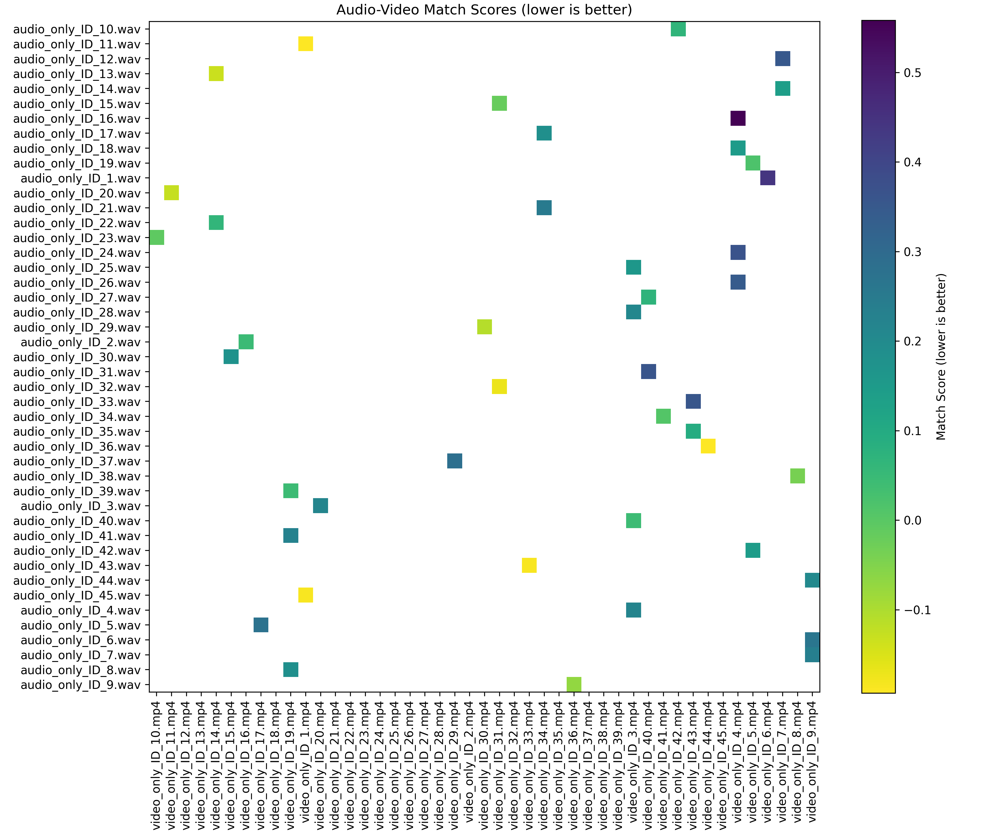

In [57]:
from IPython.display import Image, display

# Replace with the path to your PNG file
image_path = './matches/match_score_heatmap.png'

# Display the image in the notebook
display(Image(filename=image_path))

In [3]:
import numpy
import numba
print("NumPy Version:", numpy.__version__)
print("Numba Version:", numba.__version__)


NumPy Version: 2.1.3
Numba Version: 0.61.0
